# Data import

In [1]:
from azureml import Workspace

ws = Workspace()
ds = ws.datasets['train_values_wJZrCmI.csv']
ds1 = ws.datasets['train_labels.csv']
df = ds.to_dataframe()
df_labels = ds1.to_dataframe()

# Packages import

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
#to plot the graphs inline on jupyter notebook

/home/nbuser/anaconda3_23/lib/python3.4/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/home/nbuser/anaconda3_23/lib/python3.4/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/home/nbuser/anaconda3_23/lib/python3.4/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


# Combine labels and features

In [3]:
df.head()

,row_id,country,is_urban,age,female,married,religion,relationship_to_hh_head,education_level,literacy,...,reg_formal_nbfi_account,financially_included,active_bank_user,active_mm_user,active_formal_nbfi_user,active_informal_nbfi_user,nonreg_active_mm_user,num_formal_institutions_last_year,num_informal_institutions_last_year,num_financial_activities_last_year
0,0,C,False,18.0,True,True,P,Other,1.0,True,...,False,True,True,False,False,False,False,1,0,1
1,1,C,True,30.0,True,True,P,Other,1.0,True,...,False,True,True,False,False,False,False,1,0,0
2,2,A,False,20.0,True,True,Q,Spouse,1.0,True,...,False,False,False,False,False,False,False,0,0,0
3,3,A,False,61.0,False,True,Q,Head,0.0,False,...,False,False,False,False,False,False,False,0,0,0
4,4,D,False,26.0,True,True,X,Spouse,1.0,True,...,False,False,False,False,False,False,False,1,0,3


In [4]:
df = pd.merge(df, df_labels, on='row_id', how='inner')

#  Data exploration and cleaning

In [5]:
df.shape

(12600, 60)

In [6]:
df.head()

,row_id,country,is_urban,age,female,married,religion,relationship_to_hh_head,education_level,literacy,...,financially_included,active_bank_user,active_mm_user,active_formal_nbfi_user,active_informal_nbfi_user,nonreg_active_mm_user,num_formal_institutions_last_year,num_informal_institutions_last_year,num_financial_activities_last_year,poverty_probability
0,0,C,False,18.0,True,True,P,Other,1.0,True,...,True,True,False,False,False,False,1,0,1,0.515
1,1,C,True,30.0,True,True,P,Other,1.0,True,...,True,True,False,False,False,False,1,0,0,0.981
2,2,A,False,20.0,True,True,Q,Spouse,1.0,True,...,False,False,False,False,False,False,0,0,0,0.982
3,3,A,False,61.0,False,True,Q,Head,0.0,False,...,False,False,False,False,False,False,0,0,0,0.879
4,4,D,False,26.0,True,True,X,Spouse,1.0,True,...,False,False,False,False,False,False,1,0,3,0.796


In [7]:
df.dtypes

row_id                                     int64
country                                   object
is_urban                                    bool
age                                      float64
female                                      bool
married                                     bool
religion                                  object
relationship_to_hh_head                   object
education_level                          float64
literacy                                    bool
can_add                                     bool
can_divide                                  bool
can_calc_percents                           bool
can_calc_compounding                        bool
employed_last_year                          bool
employment_category_last_year             object
employment_type_last_year                 object
share_hh_income_provided                 float64
income_ag_livestock_last_year               bool
income_friends_family_last_year             bool
income_government_la

In [8]:
df.dtypes.nunique()

4

# Edx questions on data exploration

In [9]:
df_describe = df.describe()

In [10]:
df_describe.transpose()

,count,mean,std,min,25%,50%,75%,max
row_id,12600.0,6299.500000,3637.451031,0.0,3149.750,6299.500,9449.250,12599.0
age,12600.0,36.280714,15.145945,15.0,25.000,33.000,45.000,115.0
education_level,12364.0,1.316241,0.905442,0.0,1.000,1.000,2.000,3.0
share_hh_income_provided,12295.0,2.888166,1.564284,1.0,1.000,2.000,5.000,5.0
num_times_borrowed_last_year,12600.0,0.657698,0.924598,0.0,0.000,0.000,1.000,3.0
borrowing_recency,12600.0,0.866429,0.960866,0.0,0.000,0.000,2.000,2.0
bank_interest_rate,289.0,9.843080,15.033089,0.0,1.000,7.000,14.000,100.0
mm_interest_rate,151.0,9.021026,13.620161,0.0,2.750,7.000,10.000,100.0
mfi_interest_rate,201.0,10.909204,10.353298,0.0,5.000,10.000,15.000,100.0
other_fsp_interest_rate,239.0,8.216736,10.649538,0.0,2.250,6.000,10.000,100.0


In [11]:
df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
row_id,12600,NaN,NaN,NaN,6299.5,3637.45,0,3149.75,6299.5,9449.25,12599
country,12600,7,J,1843,NaN,NaN,NaN,NaN,NaN,NaN,NaN
is_urban,12600,2,False,8460,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,12600,NaN,NaN,NaN,36.2807,15.1459,15,25,33,45,115
female,12600,2,True,7028,NaN,NaN,NaN,NaN,NaN,NaN,NaN
married,12600,2,True,8172,NaN,NaN,NaN,NaN,NaN,NaN,NaN
religion,12600,5,Q,5469,NaN,NaN,NaN,NaN,NaN,NaN,NaN
relationship_to_hh_head,12600,7,Head,5229,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education_level,12364,NaN,NaN,NaN,1.31624,0.905442,0,1,1,2,3
literacy,12600,2,True,7736,NaN,NaN,NaN,NaN,NaN,NaN,NaN


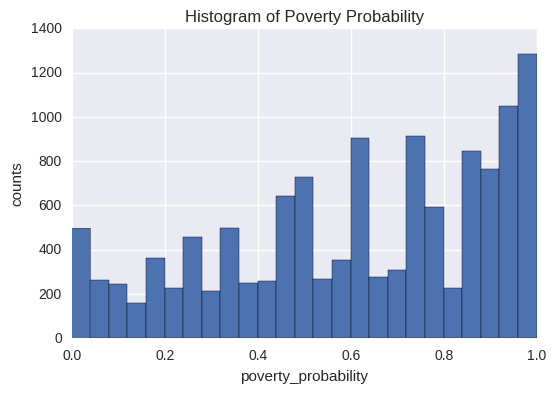

In [12]:
plt.hist(df['poverty_probability'], bins = 25) 
plt.xlabel('poverty_probability')
plt.ylabel('counts')
plt.title('Histogram of Poverty Probability')
plt.show()

In [13]:
df.groupby('country').mean()['poverty_probability']

country
A    0.752714
C    0.607907
D    0.777992
F    0.512708
G    0.549322
I    0.530406
J    0.547761
Name: poverty_probability, dtype: float64

In [14]:
df.groupby('country').median()['poverty_probability']

country
A    0.843
C    0.664
D    0.895
F    0.492
G    0.540
I    0.548
J    0.600
Name: poverty_probability, dtype: float64

In [15]:
df_age = df.groupby('age').mean()['poverty_probability']
df_age = df_age.reset_index()

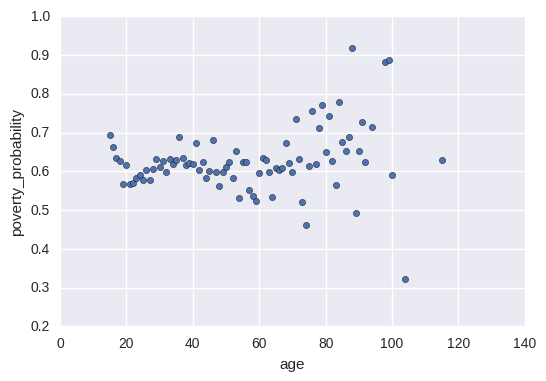

In [16]:
df_age.plot(y='poverty_probability',x='age', kind='scatter')

In [17]:
df_country = df.groupby('country').mean()
df_country

,row_id,is_urban,age,female,married,education_level,literacy,can_add,can_divide,can_calc_percents,...,financially_included,active_bank_user,active_mm_user,active_formal_nbfi_user,active_informal_nbfi_user,nonreg_active_mm_user,num_formal_institutions_last_year,num_informal_institutions_last_year,num_financial_activities_last_year,poverty_probability
country,,,,,,,,,,,,,,,,,,,,,
A,6253.387479,0.271292,36.385223,0.525663,0.800902,1.372437,0.617597,0.980823,0.948111,0.414552,...,0.405527,0.131980,0.133672,0.109983,0.034969,0.187253,0.744501,0.051889,1.009588,0.752714
C,6280.266252,0.351046,38.190503,0.521764,0.733183,1.148358,0.656303,0.860938,0.832674,0.366874,...,0.773318,0.534765,0.016393,0.058225,0.039570,0.001696,0.830413,0.081967,1.013567,0.607907
D,6356.864407,0.318753,35.730454,0.622745,0.517223,1.164294,0.810826,0.763259,0.820120,0.361400,...,0.563149,0.075451,0.407326,0.028431,0.102242,0.085839,0.724986,0.140514,1.909787,0.777992
F,6333.929904,0.378745,35.930469,0.501979,0.622951,1.563452,0.462973,0.962691,0.934992,0.323347,...,0.325608,0.262295,0.020350,0.029960,0.145280,0.003392,0.410967,0.200678,0.981345,0.512708
G,6238.646537,0.384488,35.475346,0.624377,0.508033,1.575083,0.726316,0.946814,0.868144,0.458726,...,0.754571,0.235457,0.696399,0.092521,0.285873,0.109695,1.261496,0.372853,3.691413,0.549322
I,6309.486755,0.315121,35.589404,0.480684,0.790839,1.227147,0.613135,0.958057,0.884658,0.353201,...,0.151766,0.109823,0.029249,0.007174,0.134658,0.077815,0.257174,0.150662,0.453091,0.530406
J,6322.126424,0.282149,36.697775,0.622897,0.573521,1.197060,0.410201,0.901791,0.483451,0.463918,...,0.478568,0.090071,0.373304,0.066739,0.265328,0.117743,0.766685,0.317960,1.820944,0.547761


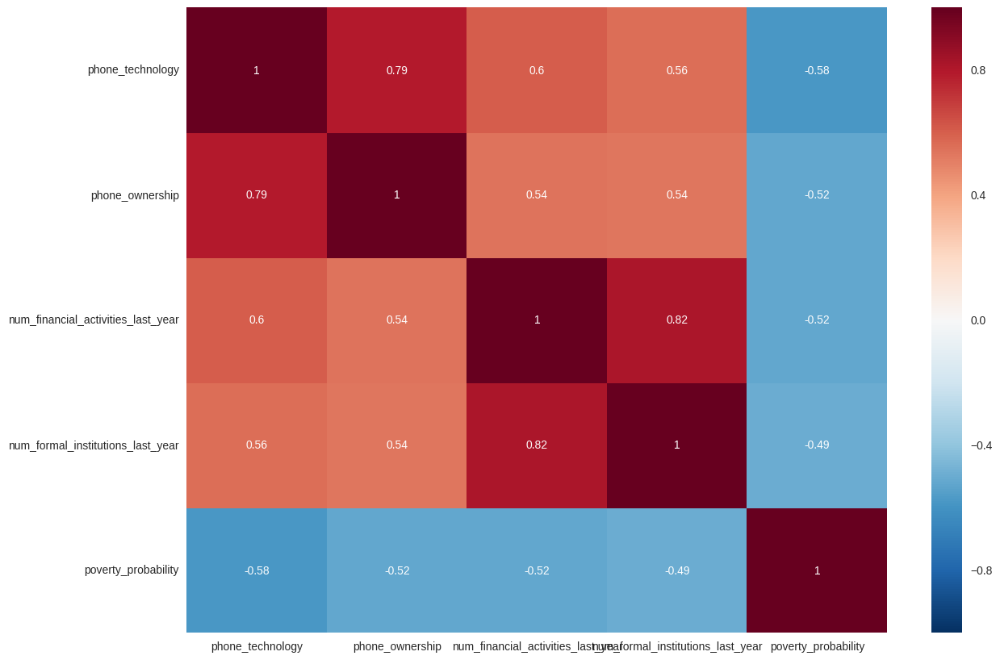

In [18]:
df_j = df.loc[df['country'] == 'J']
fig, ax = plt.subplots()
fig.set_size_inches(14, 10)
col = ['phone_technology', 'phone_ownership', 'num_financial_activities_last_year', 'num_formal_institutions_last_year', 'poverty_probability']
ax=sns.heatmap(df_j[col].corr(), annot=True)

In [19]:
df_j[col].corr()

,phone_technology,phone_ownership,num_financial_activities_last_year,num_formal_institutions_last_year,poverty_probability
phone_technology,1.000000,0.790818,0.603261,0.560701,-0.578837
phone_ownership,0.790818,1.000000,0.543690,0.538979,-0.521547
num_financial_activities_last_year,0.603261,0.543690,1.000000,0.820226,-0.521147
num_formal_institutions_last_year,0.560701,0.538979,0.820226,1.000000,-0.493797
poverty_probability,-0.578837,-0.521547,-0.521147,-0.493797,1.000000


In [20]:
df_j[col].corr().mean()

phone_technology                      0.475189
phone_ownership                       0.470388
num_financial_activities_last_year    0.489206
num_formal_institutions_last_year     0.485222
poverty_probability                  -0.223066
dtype: float64

In [21]:
b = ['education_level', 'is_urban', 'phone_technology', 'formal_savings', 'poverty_probability' ]
df_j[b].corr()

,education_level,is_urban,phone_technology,formal_savings,poverty_probability
education_level,1.000000,0.309083,0.487106,0.434428,-0.474412
is_urban,0.309083,1.000000,0.269144,0.267377,-0.447242
phone_technology,0.487106,0.269144,1.000000,0.496541,-0.578837
formal_savings,0.434428,0.267377,0.496541,1.000000,-0.452192
poverty_probability,-0.474412,-0.447242,-0.578837,-0.452192,1.000000


In [22]:
c = ['formal_savings', 'can_text', 'informal_savings', 'has_investment', 'poverty_probability']
df_j[c].corr()

,formal_savings,can_text,informal_savings,has_investment,poverty_probability
formal_savings,1.000000,0.411035,0.004615,0.251217,-0.452192
can_text,0.411035,1.000000,0.020364,0.235087,-0.466702
informal_savings,0.004615,0.020364,1.000000,0.100216,0.026909
has_investment,0.251217,0.235087,0.100216,1.000000,-0.228161
poverty_probability,-0.452192,-0.466702,0.026909,-0.228161,1.000000


In [23]:
d = ['married', 'female', 'can_divide', 'can_use_internet', 'poverty_probability']
df_j[d].corr()

,married,female,can_divide,can_use_internet,poverty_probability
married,1.000000,-0.016757,0.026328,-0.095376,0.135859
female,-0.016757,1.000000,-0.197149,-0.127601,0.057483
can_divide,0.026328,-0.197149,1.000000,0.176566,-0.128041
can_use_internet,-0.095376,-0.127601,0.176566,1.000000,-0.396728
poverty_probability,0.135859,0.057483,-0.128041,-0.396728,1.000000


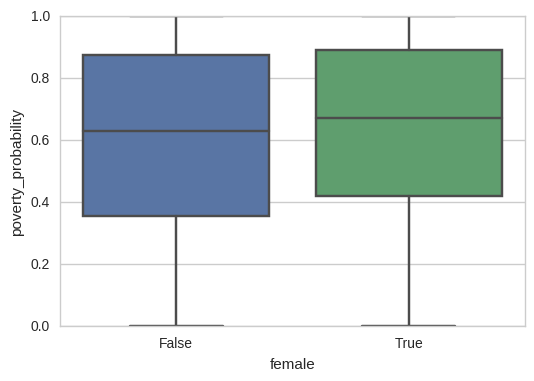

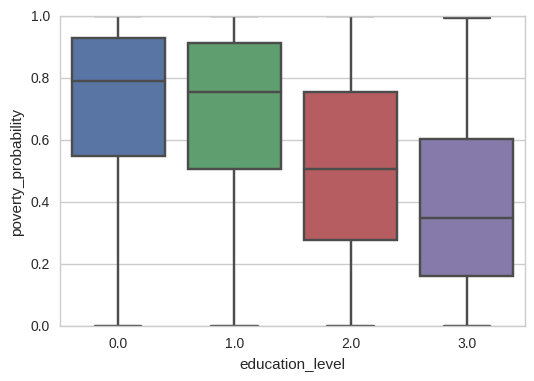

In [24]:
def plot_box(df, cols, col_y = 'poverty_probability'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.boxplot(col, col_y, data=df)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
edugen = ['female', 'education_level']        
plot_box(df, edugen)

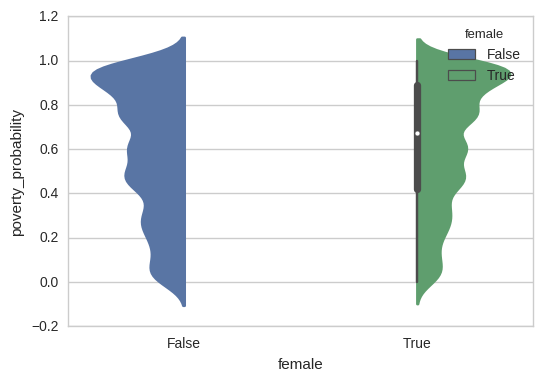

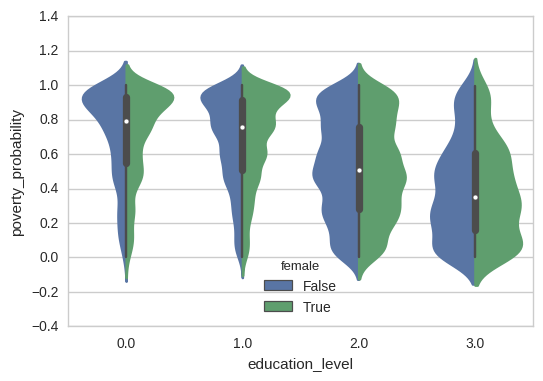

In [25]:
def plot_violin_hue(df, cols, col_y = 'poverty_probability', hue_col = 'female'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.violinplot(col, col_y, data=df, hue = hue_col, split = True)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_violin_hue(df, edugen)

In [26]:
df.get_dtype_counts()

bool       37
float64     9
int64       9
object      5
dtype: int64

# Finding Null values, removing duplicates and cleaning these

In [29]:
print(df.shape)
print(df.row_id.unique().shape)

(12600, 60)
(12600,)


Reviewing the null values, we can see that the features education level and share_hh_income_provided contains a small percentage null values compared to the total of that feature. Therefore we will drop these values rows from the data frame. 

In [30]:
df = df.dropna(axis=0, how='any', thresh=None, subset=['education_level', 'share_hh_income_provided'], inplace=False)

In [31]:
df.shape

(12068, 60)

In [32]:
df.isnull().sum()

row_id                                       0
country                                      0
is_urban                                     0
age                                          0
female                                       0
married                                      0
religion                                     0
relationship_to_hh_head                      0
education_level                              0
literacy                                     0
can_add                                      0
can_divide                                   0
can_calc_percents                            0
can_calc_compounding                         0
employed_last_year                           0
employment_category_last_year                0
employment_type_last_year                    0
share_hh_income_provided                     0
income_ag_livestock_last_year                0
income_friends_family_last_year              0
income_government_last_year                  0
income_own_bu

The features bank_interest_rate, mm_interest_rate and mfi_interest_rate contains contains a majority of null values therefore these feature columns will be drop from the data frame. 
The columns bank_interest_rate                       7986
mm_interest_rate                         8114
mfi_interest_rate                        8111
other_fsp_interest_rate                  8041
have a majority of NaN values, making the use of these columns irrelevant for the data analysis.

In [33]:
df = df.dropna(axis=1, how="any") 

In [34]:
df.isnull().sum()

row_id                                   0
country                                  0
is_urban                                 0
age                                      0
female                                   0
married                                  0
religion                                 0
relationship_to_hh_head                  0
education_level                          0
literacy                                 0
can_add                                  0
can_divide                               0
can_calc_percents                        0
can_calc_compounding                     0
employed_last_year                       0
employment_category_last_year            0
employment_type_last_year                0
share_hh_income_provided                 0
income_ag_livestock_last_year            0
income_friends_family_last_year          0
income_government_last_year              0
income_own_business_last_year            0
income_private_sector_last_year          0
income_publ

In [35]:
df.get_dtype_counts()

bool       37
float64     5
int64       9
object      5
dtype: int64

In [36]:
df.shape

(12068, 56)

In [37]:
df.head()

,row_id,country,is_urban,age,female,married,religion,relationship_to_hh_head,education_level,literacy,...,financially_included,active_bank_user,active_mm_user,active_formal_nbfi_user,active_informal_nbfi_user,nonreg_active_mm_user,num_formal_institutions_last_year,num_informal_institutions_last_year,num_financial_activities_last_year,poverty_probability
0,0,C,False,18.0,True,True,P,Other,1.0,True,...,True,True,False,False,False,False,1,0,1,0.515
2,2,A,False,20.0,True,True,Q,Spouse,1.0,True,...,False,False,False,False,False,False,0,0,0,0.982
4,4,D,False,26.0,True,True,X,Spouse,1.0,True,...,False,False,False,False,False,False,1,0,3,0.796
5,5,A,True,36.0,True,True,Q,Spouse,1.0,False,...,True,False,False,True,False,False,1,0,0,0.915
6,6,C,False,35.0,False,True,P,Head,1.0,False,...,True,True,False,False,False,False,1,0,1,0.447


The remaining data set contains 8059 rows with 55 features that we will use in further analysis. 

# Exploring the features

In [38]:
df.describe()

,row_id,age,education_level,share_hh_income_provided,num_times_borrowed_last_year,borrowing_recency,num_shocks_last_year,avg_shock_strength_last_year,phone_technology,phone_ownership,num_formal_institutions_last_year,num_informal_institutions_last_year,num_financial_activities_last_year,poverty_probability
count,12068.000000,12068.000000,12068.000000,12068.000000,12068.000000,12068.000000,12068.000000,12068.000000,12068.000000,12068.000000,12068.000000,12068.000000,12068.000000,12068.000000
mean,6312.377776,36.276185,1.316291,2.888300,0.660093,0.872058,1.103580,2.123134,1.223318,1.482516,0.729616,0.194564,1.600099,0.608857
std,3636.571928,15.037812,0.903742,1.564646,0.923874,0.961187,1.191547,2.022139,1.092899,0.767563,0.807724,0.480080,2.058281,0.291270
min,0.000000,15.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3170.750000,25.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.394000
50%,6310.500000,33.000000,1.000000,2.000000,0.000000,0.000000,1.000000,2.000000,1.000000,2.000000,1.000000,0.000000,1.000000,0.633000
75%,9461.250000,45.000000,2.000000,5.000000,1.000000,2.000000,2.000000,4.000000,2.000000,2.000000,1.000000,0.000000,3.000000,0.879000
max,12599.000000,115.000000,3.000000,5.000000,3.000000,2.000000,5.000000,5.000000,3.000000,2.000000,6.000000,4.000000,10.000000,1.000000


/home/nbuser/anaconda3_23/lib/python3.4/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


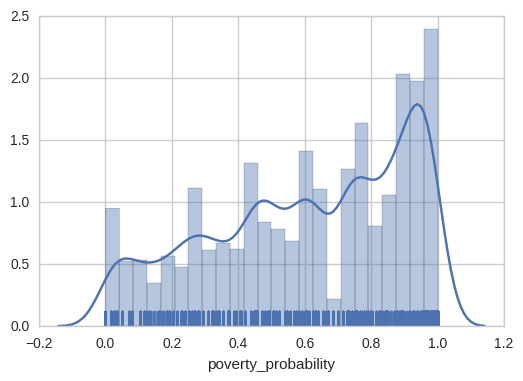

In [39]:
sns.distplot(df['poverty_probability'], rug=True,)

In [40]:
num_features = ['age', 'education_level', 'share_hh_income_provided', 'num_times_borrowed_last_year', 'borrowing_recency', 'num_shocks_last_year', 'avg_shock_strength_last_year', 'phone_technology', 'phone_ownership', 'num_formal_institutions_last_year', 'num_informal_institutions_last_year', 'num_financial_activities_last_year', 'poverty_probability']

In [41]:
dfmean = df[num_features].mean

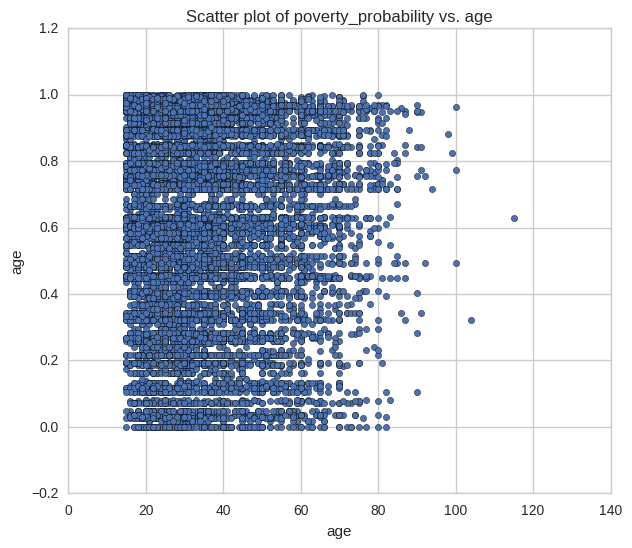

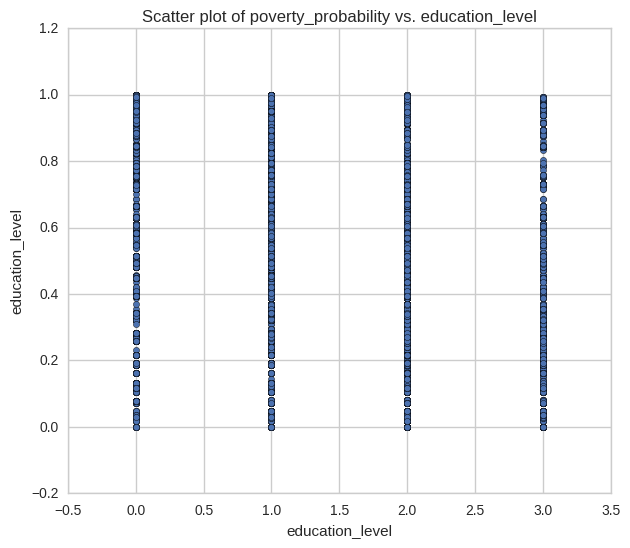

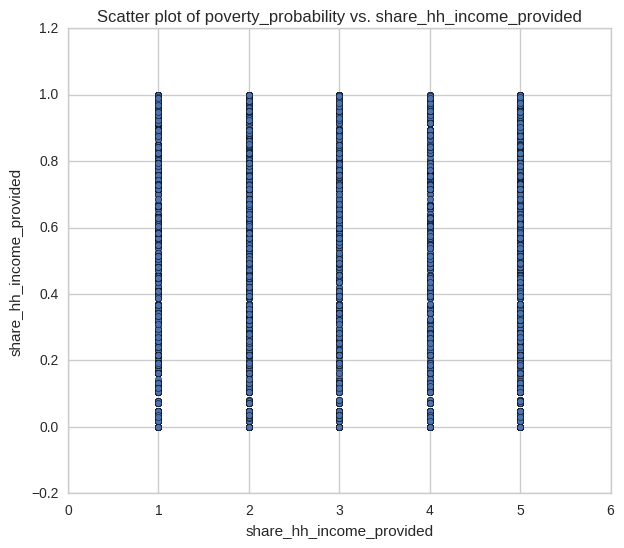

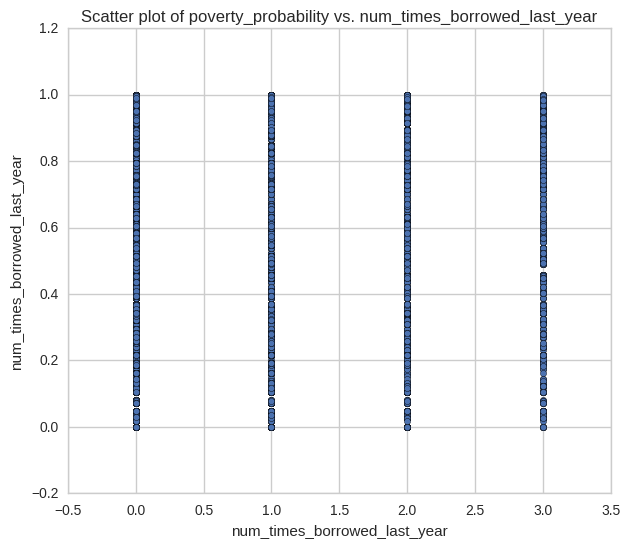

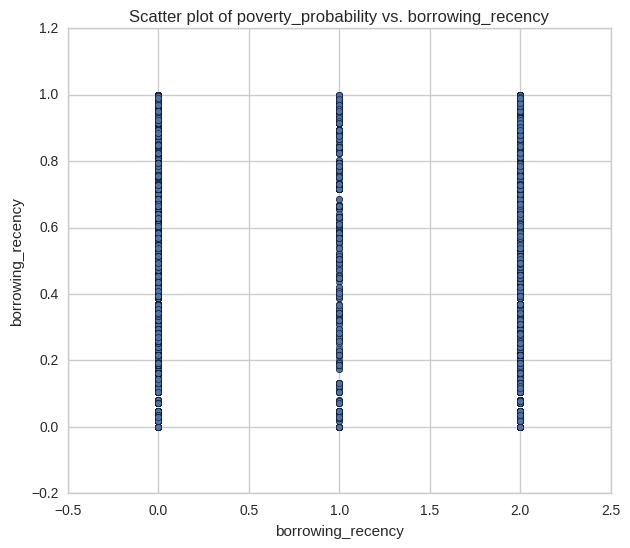

...

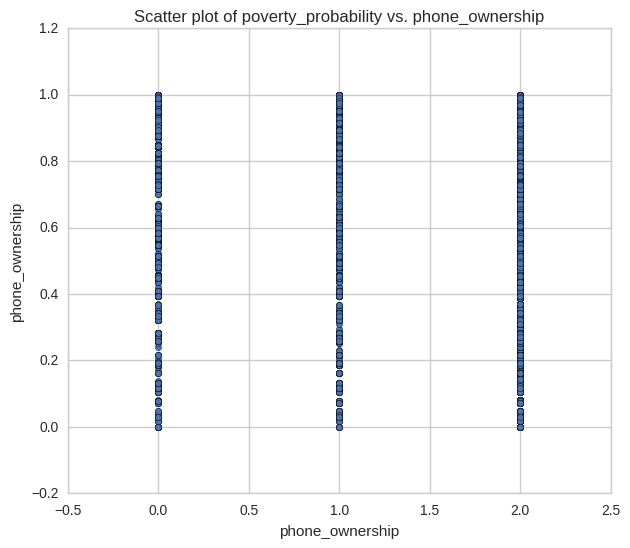

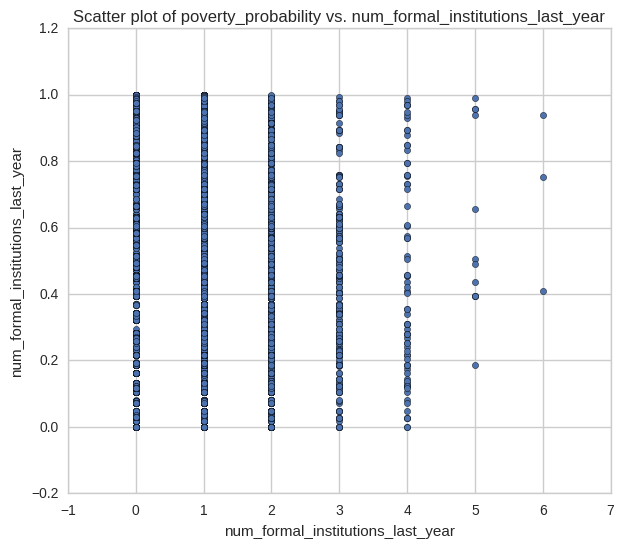

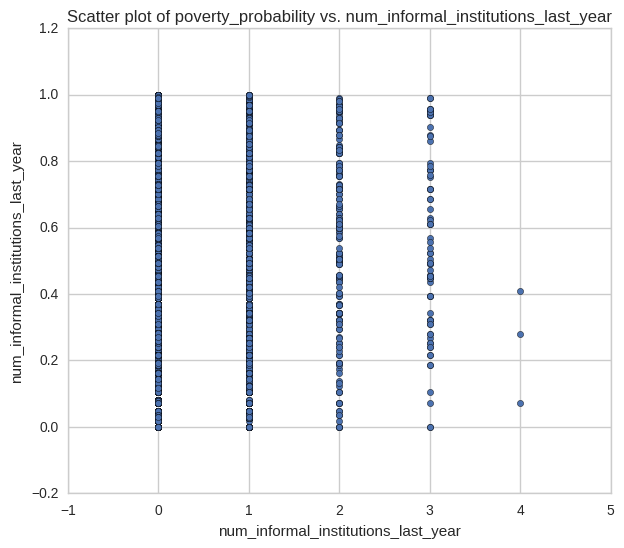

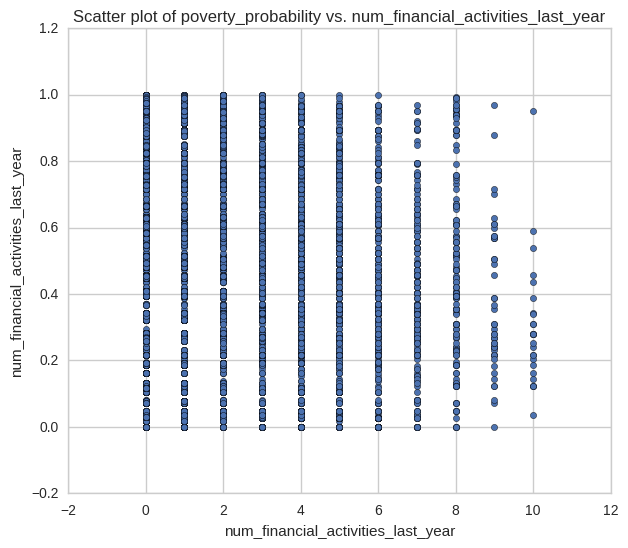

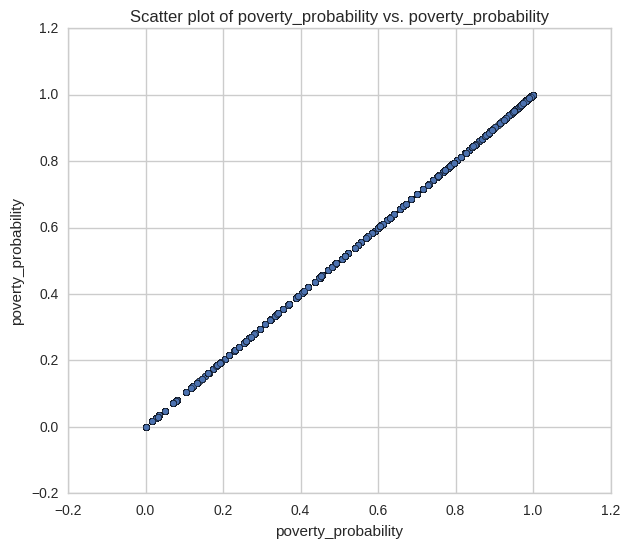

In [42]:
def plot_scatter(df, cols, col_y = 'poverty_probability'):
    for col in cols:
        fig = plt.figure(figsize=(7,6)) # define plot area
        ax = fig.gca() # define axis   
        df.plot.scatter(x = col, y = col_y, ax = ax)
        ax.set_title('Scatter plot of ' + col_y + ' vs. ' + col) # Give the plot a main title
        ax.set_xlabel(col) # Set text for the x axis
        ax.set_ylabel(col)# Set text for y axis
        plt.show()

plot_scatter(df, num_features)  

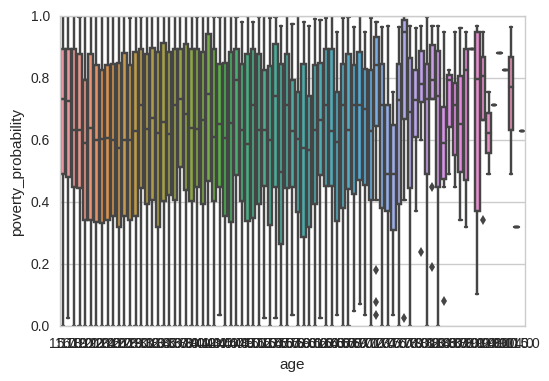

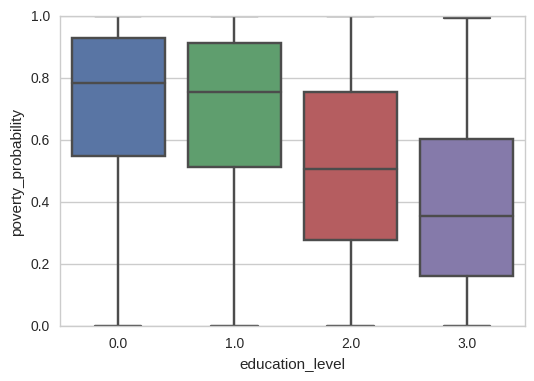

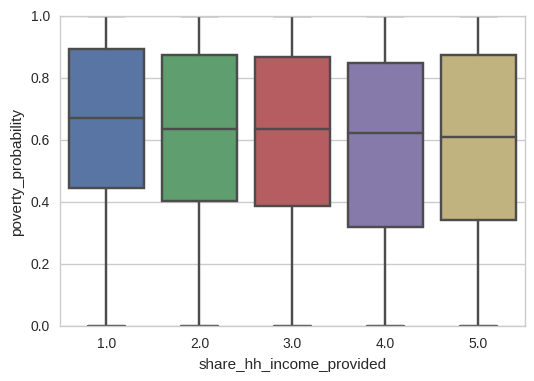

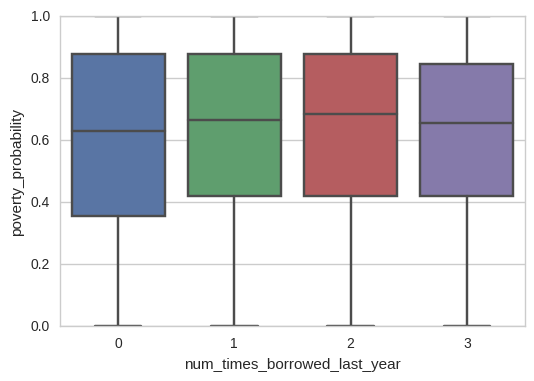

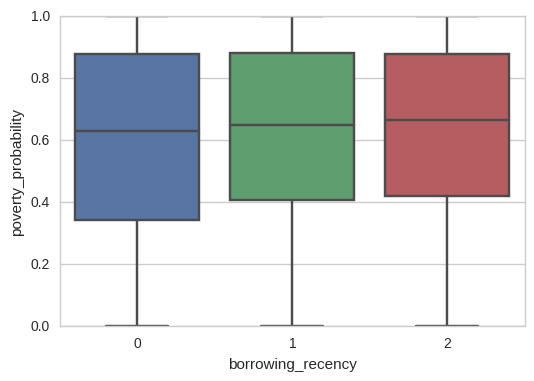

...

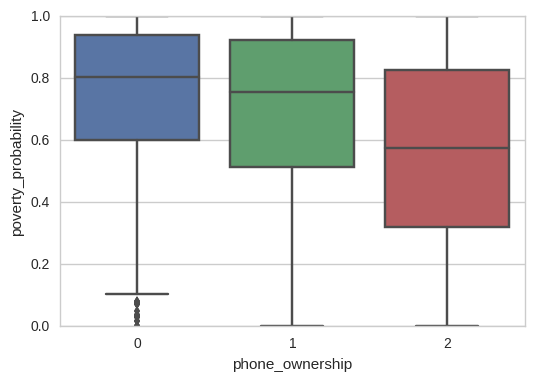

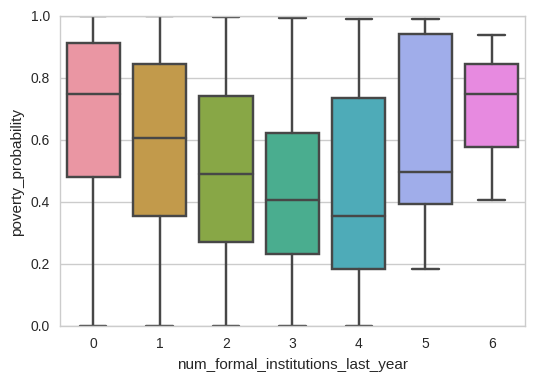

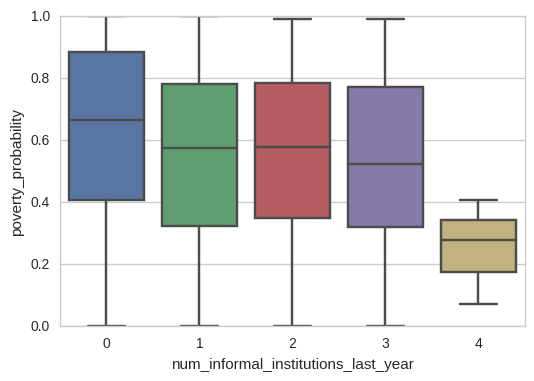

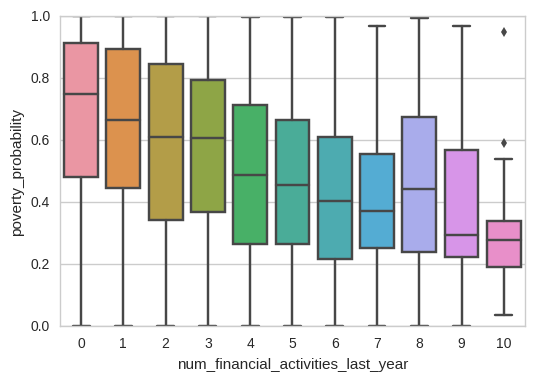

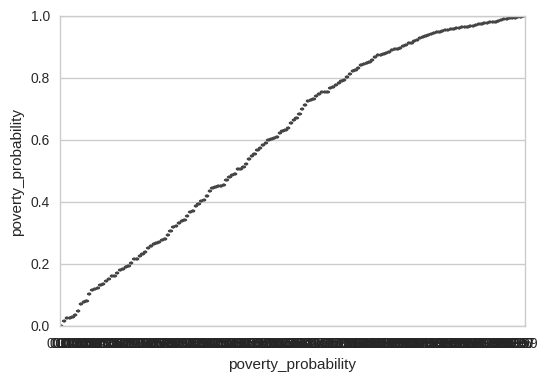

In [43]:
def plot_box(df, cols, col_y = 'poverty_probability'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.boxplot(col, col_y, data=df)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_box(df, num_features) 

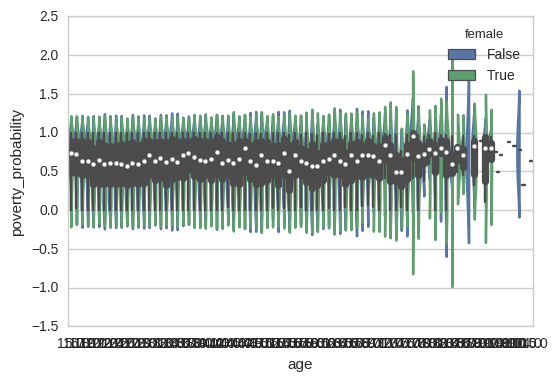

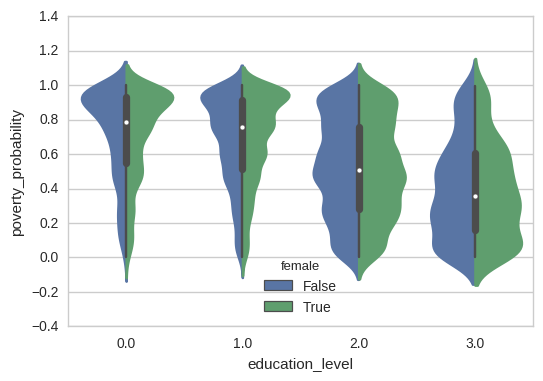

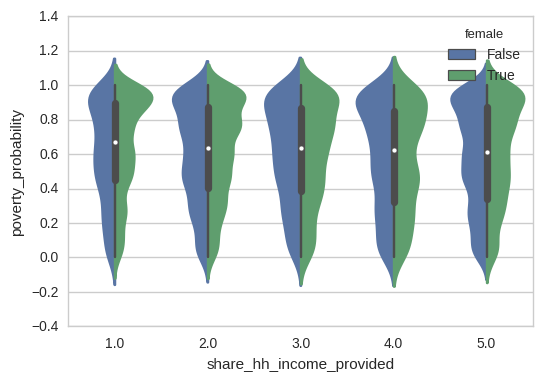

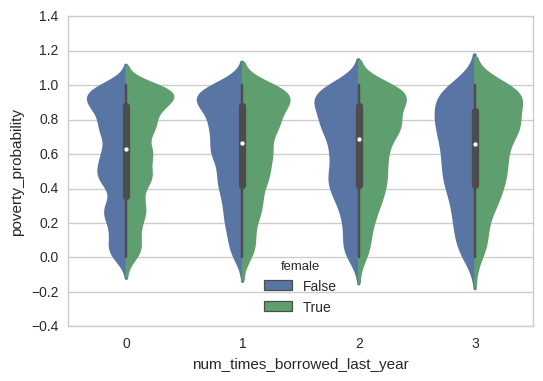

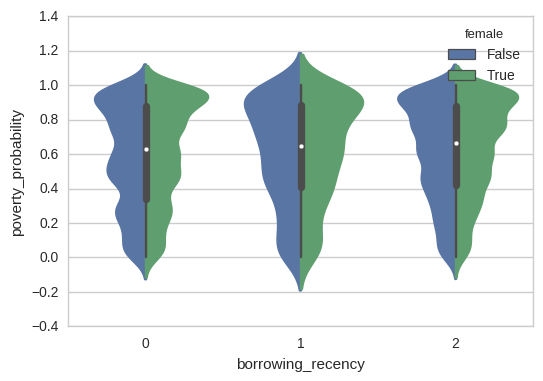

...

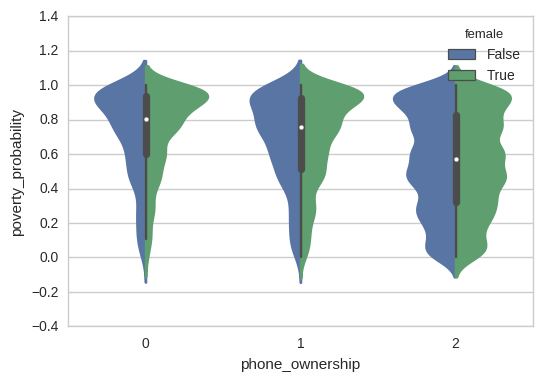

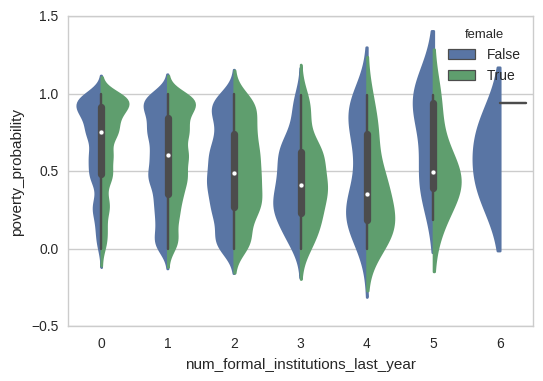

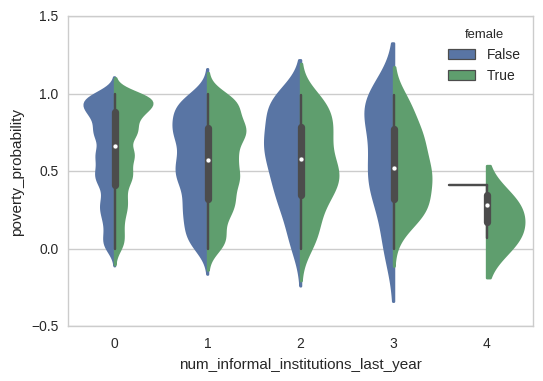

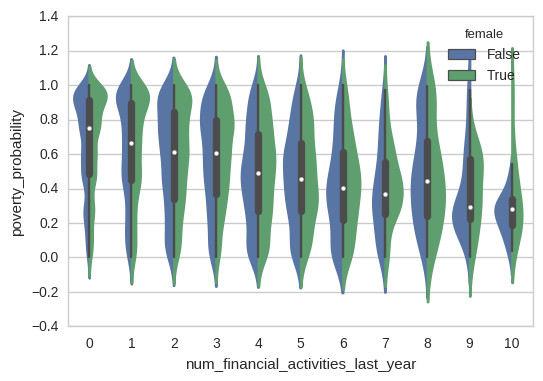

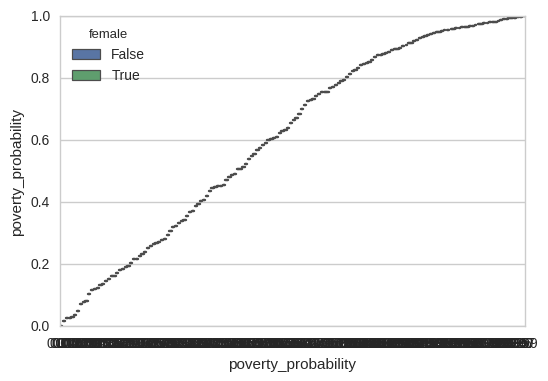

In [44]:
def plot_violin_hue(df, cols, col_y = 'poverty_probability', hue_col = 'female'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.violinplot(col, col_y, data=df, hue = hue_col, split = True)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_violin_hue(df, num_features)

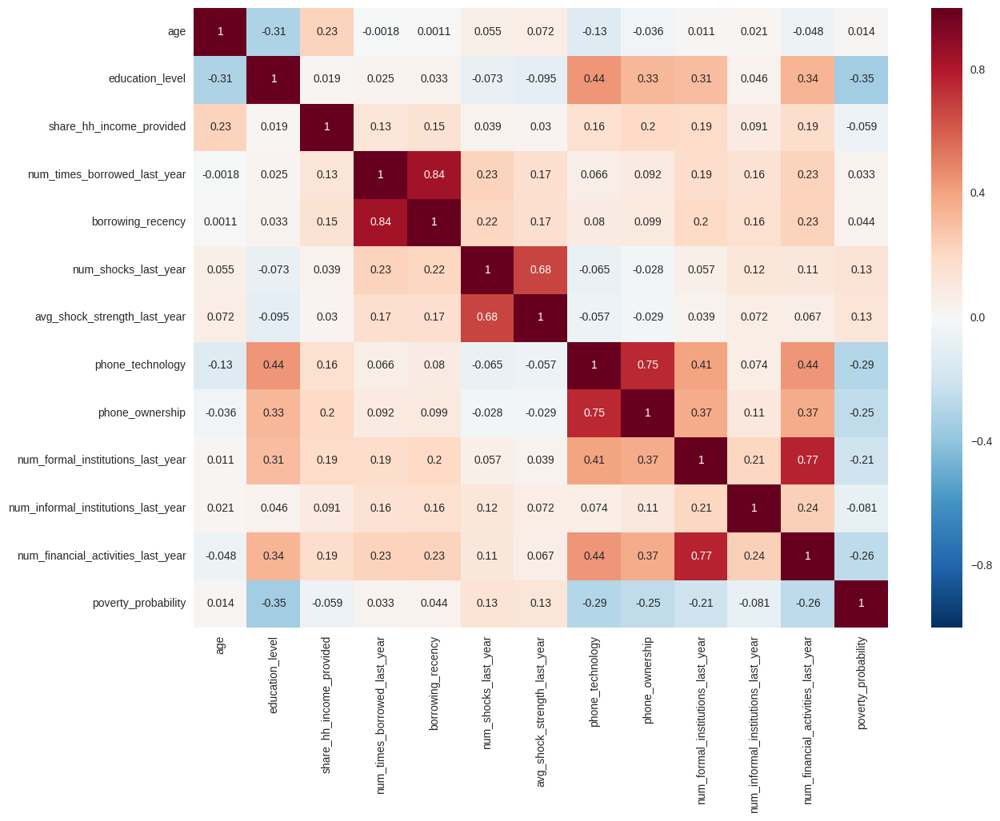

In [45]:
fig, ax = plt.subplots()
fig.set_size_inches(14, 10)

ax=sns.heatmap(df[num_features].corr(),annot=True)

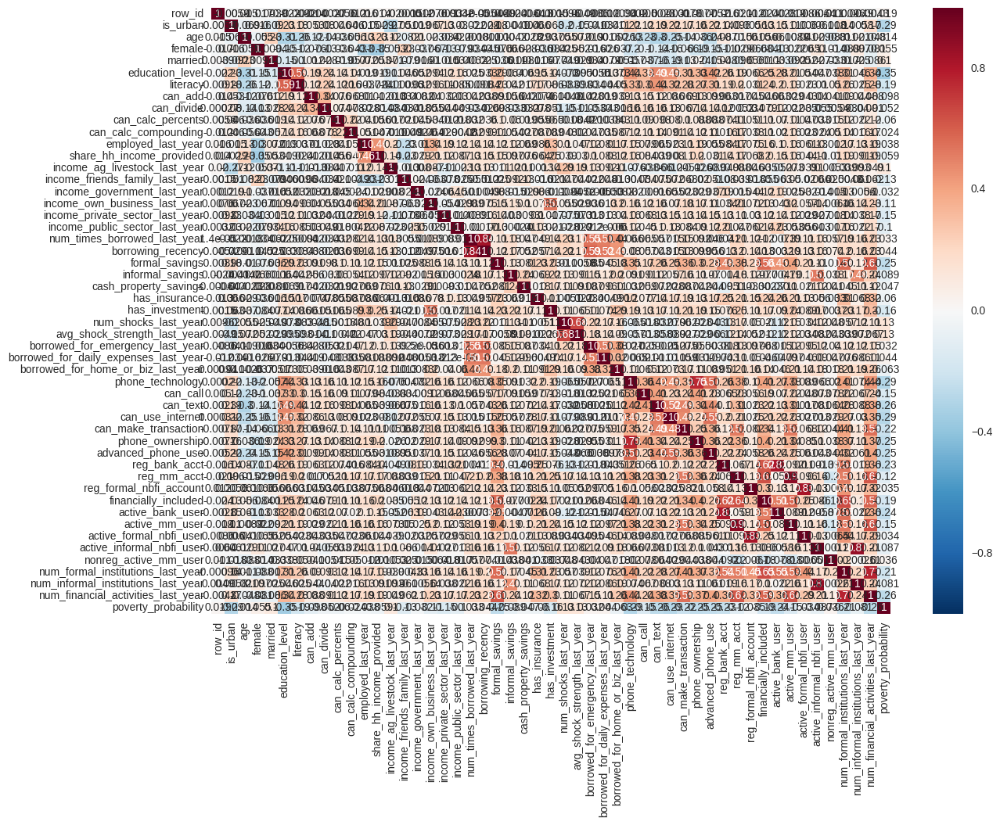

In [46]:
fig, ax = plt.subplots()
fig.set_size_inches(14, 10)

ax=sns.heatmap(df.corr(),annot=True)

In [47]:
df.corr()

,row_id,is_urban,age,female,married,education_level,literacy,can_add,can_divide,can_calc_percents,...,financially_included,active_bank_user,active_mm_user,active_formal_nbfi_user,active_informal_nbfi_user,nonreg_active_mm_user,num_formal_institutions_last_year,num_informal_institutions_last_year,num_financial_activities_last_year,poverty_probability
row_id,1.000000,-0.005900,0.014945,-0.016785,0.003928,-0.022101,-0.009181,-0.014411,-0.000272,-0.005647,...,-0.024198,-0.002809,-0.018573,0.008605,-0.006415,0.010591,-0.000958,0.004893,-0.004274,0.018631
is_urban,-0.005900,1.000000,-0.068608,0.016129,-0.089963,0.229681,0.179319,0.052986,0.080188,0.046087,...,0.134549,0.153674,0.108093,0.006007,0.006109,-0.018373,0.138613,0.005828,0.171446,-0.291964
age,0.014945,-0.068608,1.000000,-0.055244,0.229391,-0.307122,-0.263759,-0.122660,-0.135489,-0.036123,...,0.056322,0.061423,-0.008871,0.041228,0.028688,-0.088125,0.010877,0.020932,-0.048097,0.014325
female,-0.016785,0.016129,-0.055244,1.000000,0.009371,-0.152612,-0.115119,-0.075695,-0.129779,-0.036355,...,-0.084110,-0.127018,-0.022227,0.006467,0.109825,-0.014109,-0.088194,0.097271,-0.080595,0.055398
married,0.003928,-0.089963,0.229391,0.009371,1.000000,-0.148512,-0.104099,0.012411,0.027985,-0.018918,...,0.001090,0.032577,-0.092046,0.051918,0.027466,-0.033122,-0.016540,0.025069,-0.086044,0.100638
education_level,-0.022101,0.229681,-0.307122,-0.152612,-0.148512,1.000000,0.588739,0.189077,0.235311,0.138905,...,0.249643,0.278010,0.205279,0.053920,0.046854,0.037605,0.307660,0.045908,0.342032,-0.346830
literacy,-0.009181,0.179319,-0.263759,-0.115119,-0.104099,0.588739,1.000000,0.117658,0.244392,0.119628,...,0.237957,0.198146,0.194467,0.022907,0.010072,0.050080,0.256863,0.025246,0.284485,-0.191651
can_add,-0.014411,0.052986,-0.122660,-0.075695,0.012411,0.189077,0.117658,1.000000,0.343128,0.075968,...,0.045726,0.063012,0.028714,0.042943,0.040100,0.040666,0.089937,0.044041,0.087919,-0.098133
can_divide,-0.000272,0.080188,-0.135489,-0.129779,0.027985,0.235311,0.244392,0.343128,1.000000,0.074037,...,0.078653,0.123544,0.021994,0.035096,-0.055319,-0.005408,0.093488,-0.039628,0.090757,-0.052024
can_calc_percents,-0.005647,0.046087,-0.036123,-0.036355,-0.018918,0.138905,0.119628,0.075968,0.074037,1.000000,...,0.107884,0.069723,0.109745,0.046664,0.033204,0.015383,0.118402,0.022326,0.115321,-0.059519


# First we will explore the demographics features in the data frame to undestand these better and to identify which are best to use in our model. 

# Demographics

/home/nbuser/anaconda3_23/lib/python3.4/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


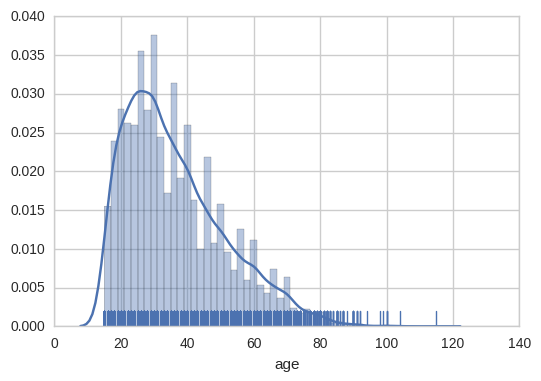

In [48]:
sns.distplot(df['age'], rug=True,)

In [49]:
num_cols = ['age']

/home/nbuser/anaconda3_23/lib/python3.4/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


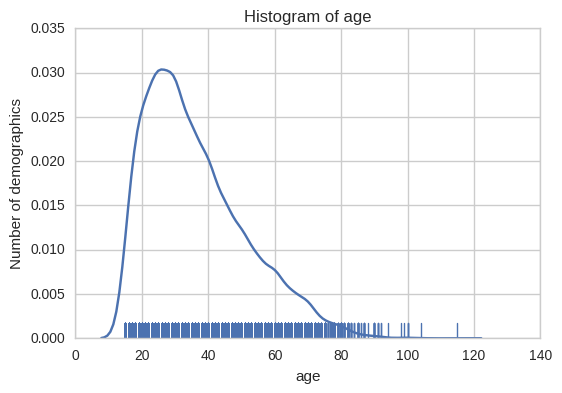

In [50]:
def plot_density_hist(df, cols, bins = 10, hist = False):
    for col in cols:
        sns.set_style("whitegrid")
        sns.distplot(df[col], bins = bins, rug=True, hist = hist)
        plt.title('Histogram of ' + col) # Give the plot a main title
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel('Number of demographics')# Set text for y axis
        plt.show()
        
plot_density_hist(df, num_cols)  

/home/nbuser/anaconda3_23/lib/python3.4/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


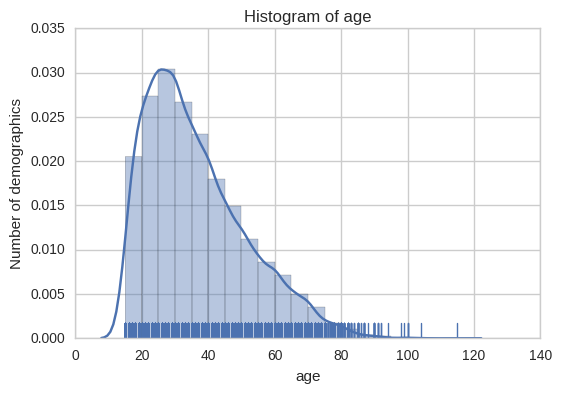

In [51]:
plot_density_hist(df, num_cols, bins = 20, hist = True)    

The age feature is right skewed with a few outliers over 80 years of age. The majority of the data is between 20-40 years of age. The feature may benefit from creating age group ranges.

In [52]:
def count_unique(df, cols):
    for col in cols:
        print('\n' + 'For column ' + col)
        print(df[col].value_counts())

demographics_cols = ['age','country', 'is_urban', 'female', 'married', 'religion', 'relationship_to_hh_head']
count_unique(df, demographics_cols)


For column age
30.0     604
25.0     553
35.0     517
40.0     455
20.0     391
45.0     371
28.0     365
22.0     352
18.0     330
32.0     319
24.0     315
23.0     313
27.0     309
26.0     304
29.0     303
19.0     287
21.0     280
31.0     270
50.0     266
17.0     247
38.0     245
36.0     241
37.0     218
33.0     218
42.0     217
55.0     213
16.0     213
34.0     198
60.0     197
41.0     175
        ... 
64.0      44
67.0      44
68.0      43
69.0      36
80.0      33
71.0      31
72.0      27
77.0      22
73.0      21
74.0      19
78.0      19
82.0      14
79.0      12
85.0      10
81.0      10
90.0       8
76.0       7
87.0       7
83.0       6
91.0       4
100.0      3
84.0       3
92.0       2
86.0       2
94.0       1
115.0      1
104.0      1
88.0       1
98.0       1
99.0       1
Name: age, dtype: int64

For column country
J    1819
D    1792
G    1790
I    1776
C    1690
A    1690
F    1511
Name: country, dtype: int64

For column is_urban
False    8079
True     3989


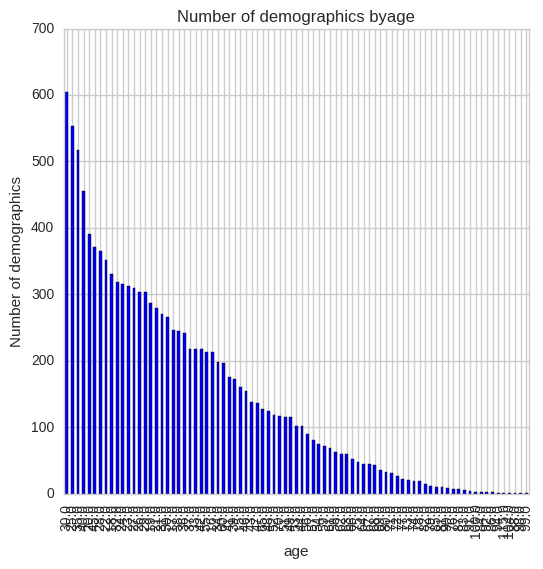

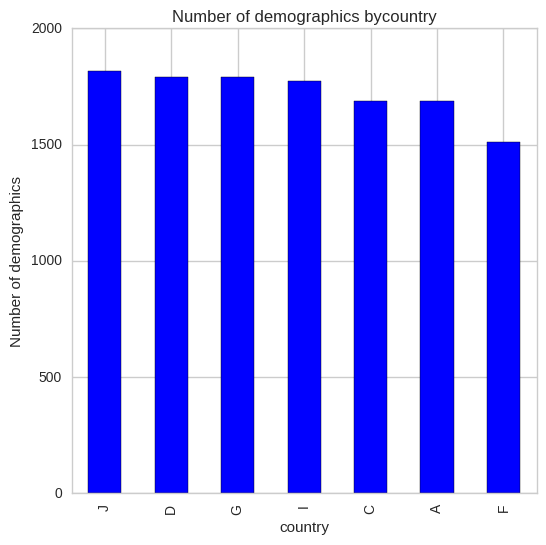

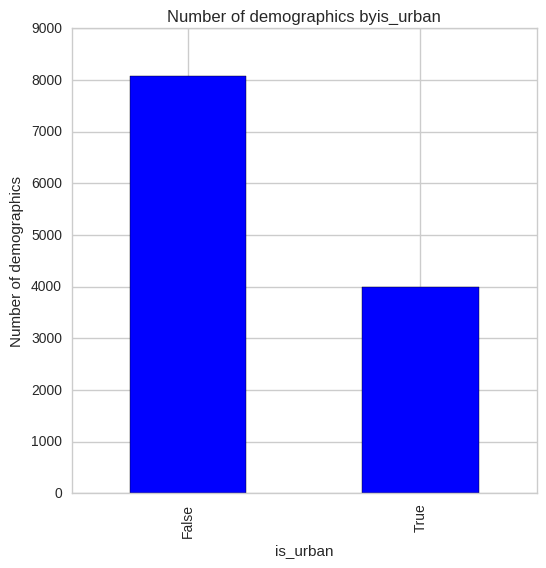

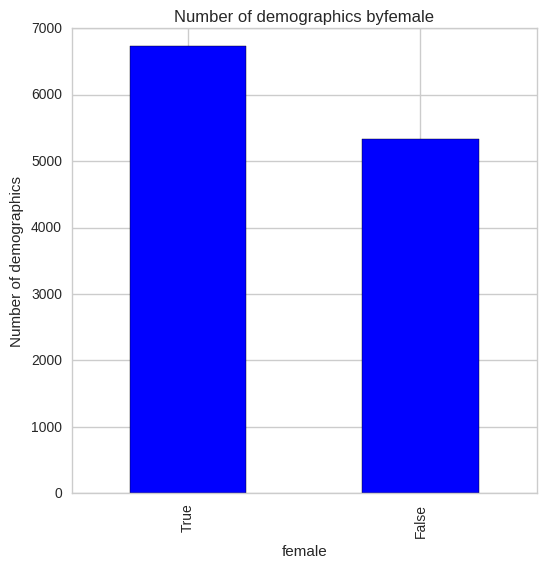

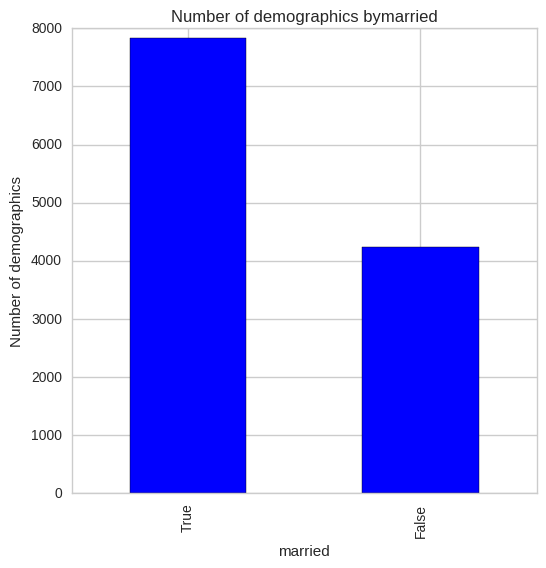

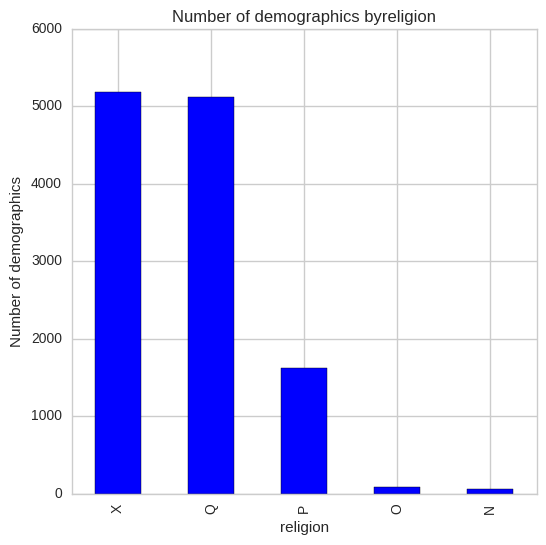

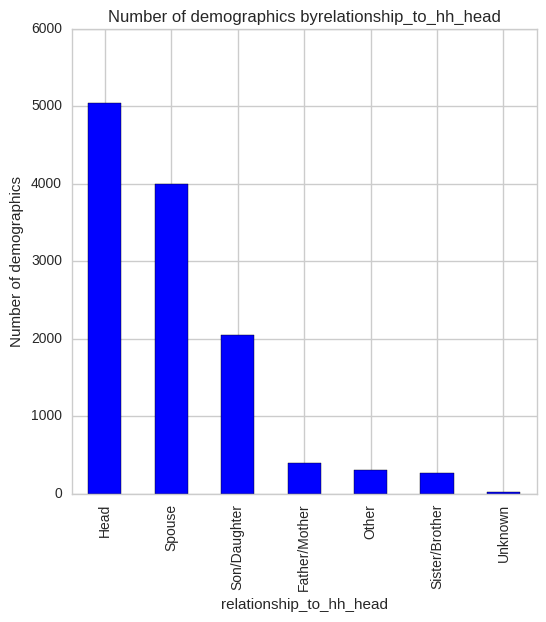

In [53]:
def plot_bars(df, cols):
    for col in cols:
        fig = plt.figure(figsize=(6,6)) # define plot area
        ax = fig.gca() # define axis    
        counts = df[col].value_counts() # find the counts for each unique category
        counts.plot.bar(ax = ax, color = 'blue') # Use the plot.bar method on the counts data frame
        ax.set_title('Number of demographics by' + col) # Give the plot a main title
        ax.set_xlabel(col) # Set text for the x axis
        ax.set_ylabel('Number of demographics')# Set text for y axis
        plt.show()

plot_bars(df, demographics_cols)

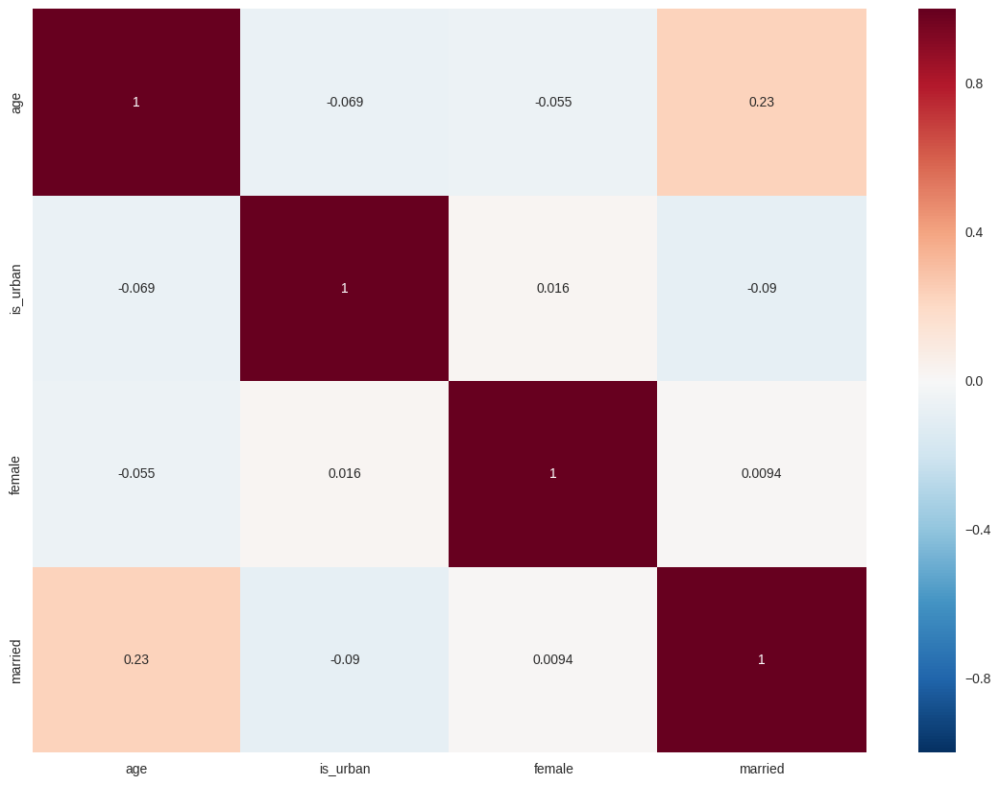

In [54]:
fig, ax = plt.subplots()
fig.set_size_inches(14, 10)

ax=sns.heatmap(df[demographics_cols].corr(),annot=True)

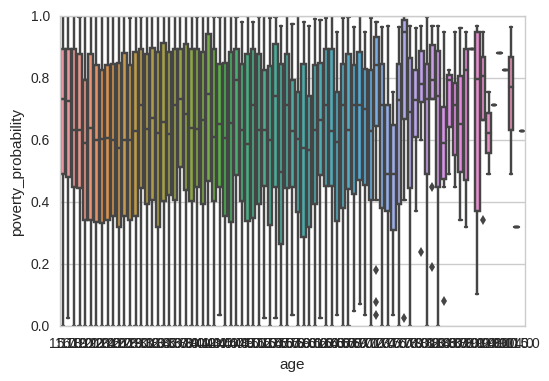

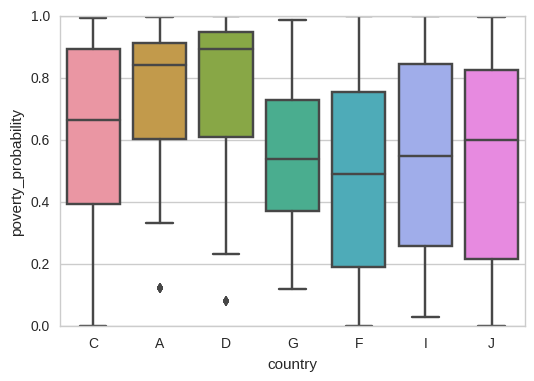

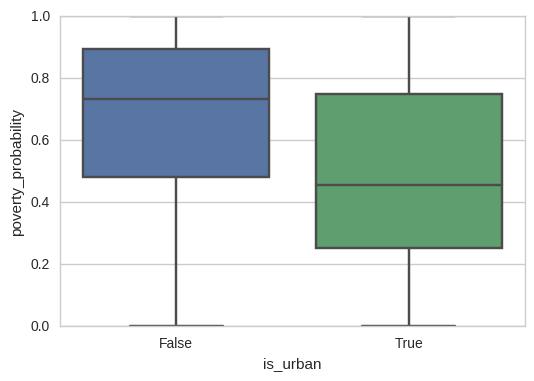

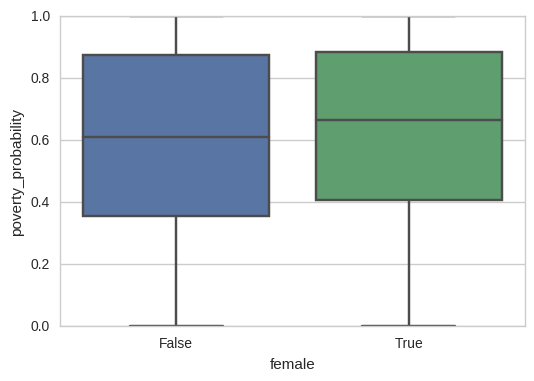

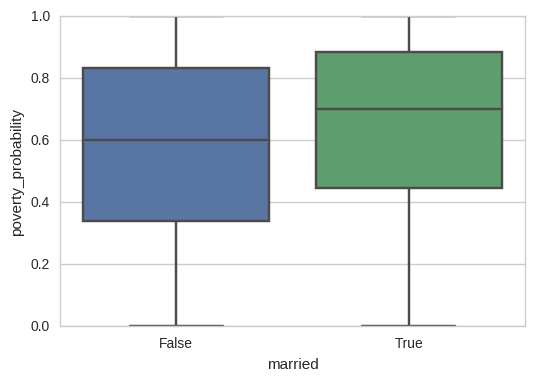

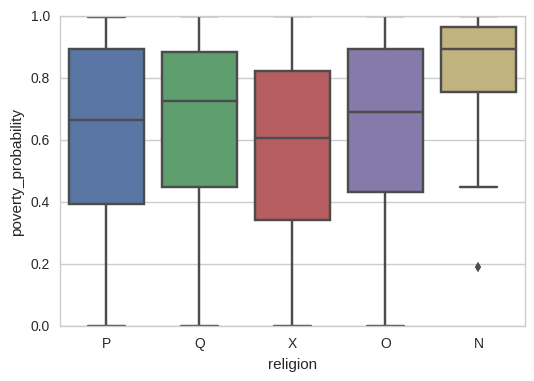

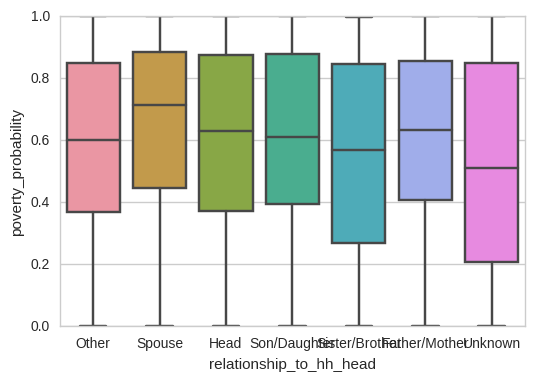

In [55]:
def plot_box(df, cols, col_y = 'poverty_probability'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.boxplot(col, col_y, data=df)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_box(df, demographics_cols) 

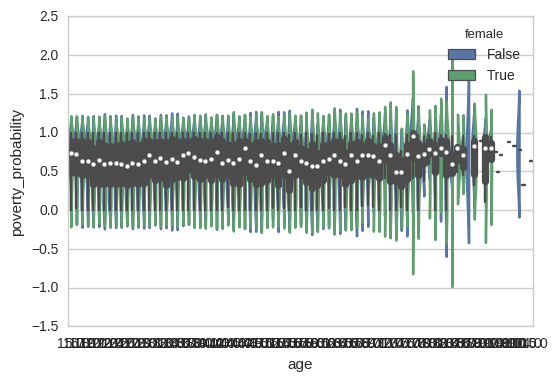

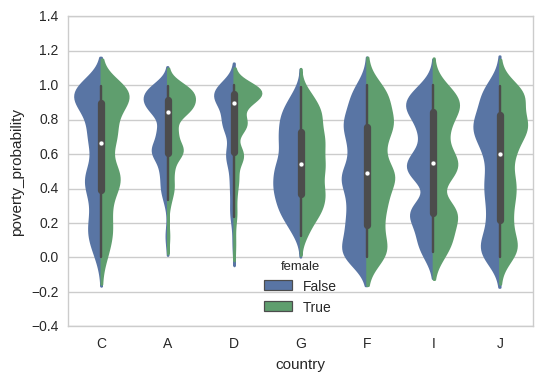

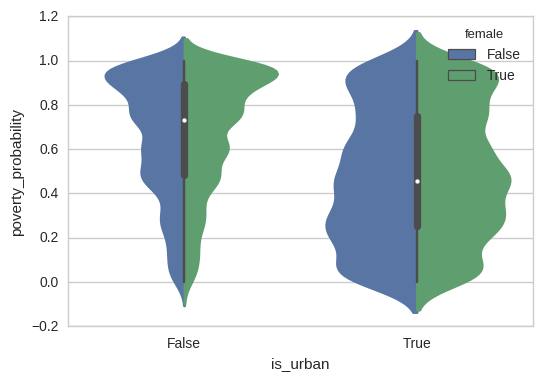

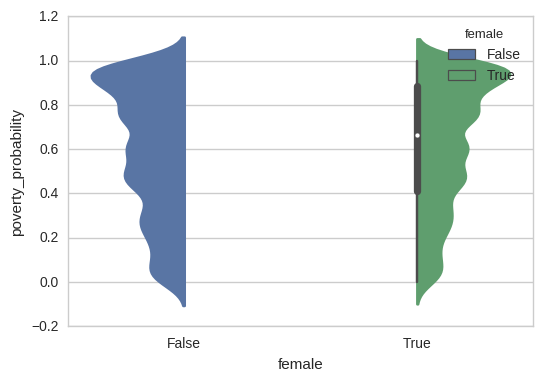

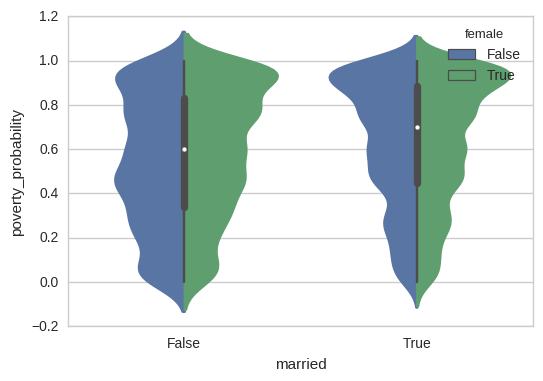

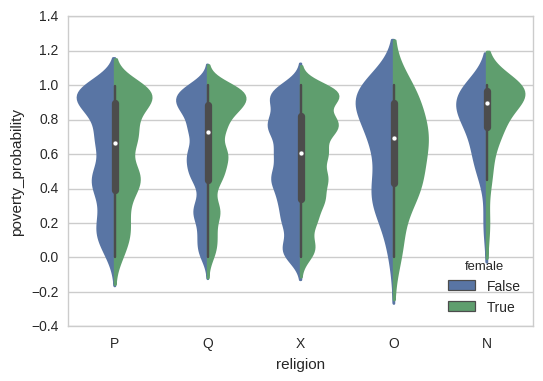

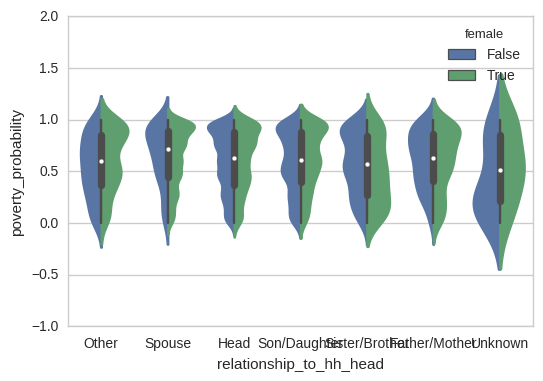

In [56]:
def plot_violin(df, cols, col_y = 'poverty_probability',hue_col = 'female'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.violinplot(col, col_y, data=df, hue = hue_col, split = True)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_violin(df, demographics_cols) 

Feature engineering

demographics_cols = ['age','country', 'is_urban', 'female', 'married', 'religion', 'relationship_to_hh_head']
Age is right skewed. 

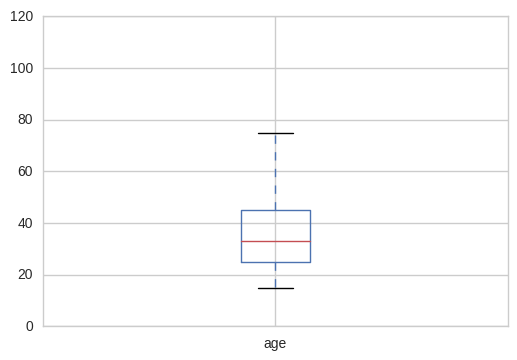

In [57]:
df.plot.box(y = 'age', x = 'poverty_probability')

In [58]:
df['age_bin'] = pd.cut(df['age'], [0, 18, 30, 60, 120], labels=['0-18', '18-30', '30-60', '60-120'])

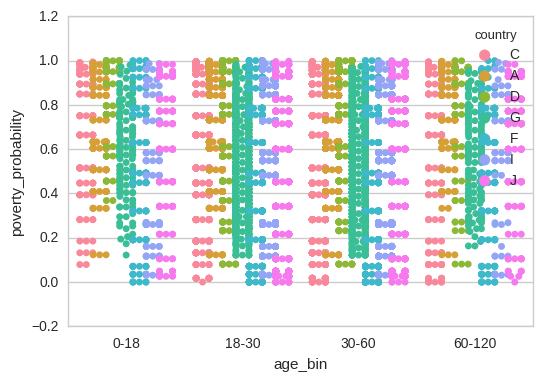

In [59]:
        sns.set_style("whitegrid")
        sns.swarmplot('age_bin', 'poverty_probability', data=df, hue = 'country', split = True)
        plt.xlabel('age_bin') # Set text for the x axis
        plt.ylabel('poverty_probability')# Set text for y axis
        plt.show()

# Education

In [60]:
education_col = ['education_level', 'literacy', 'can_add', 'can_divide', 'can_calc_percents', 'can_calc_compounding']

In [61]:
def count_unique(df, cols):
    for col in cols:
        print('\n' + 'For column ' + col)
        print(df[col].value_counts())

count_unique(df, education_col)


For column education_level
1.0    4464
2.0    3981
0.0    2470
3.0    1153
Name: education_level, dtype: int64

For column literacy
True     7520
False    4548
Name: literacy, dtype: int64

For column can_add
True     11002
False     1066
Name: can_add, dtype: int64

For column can_divide
True     9933
False    2135
Name: can_divide, dtype: int64

For column can_calc_percents
False    7264
True     4804
Name: can_calc_percents, dtype: int64

For column can_calc_compounding
False    6637
True     5431
Name: can_calc_compounding, dtype: int64


/home/nbuser/anaconda3_23/lib/python3.4/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


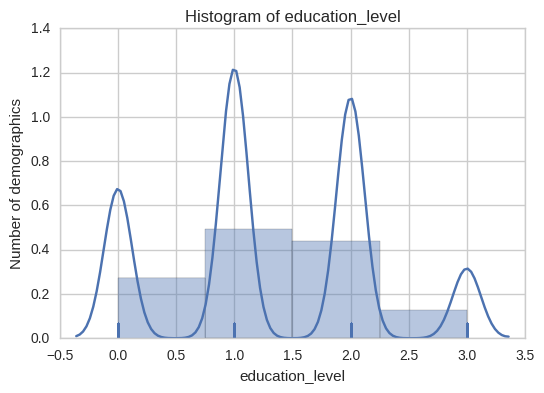

In [62]:
plot_density_hist(df, ['education_level'], bins = 4, hist = True)    

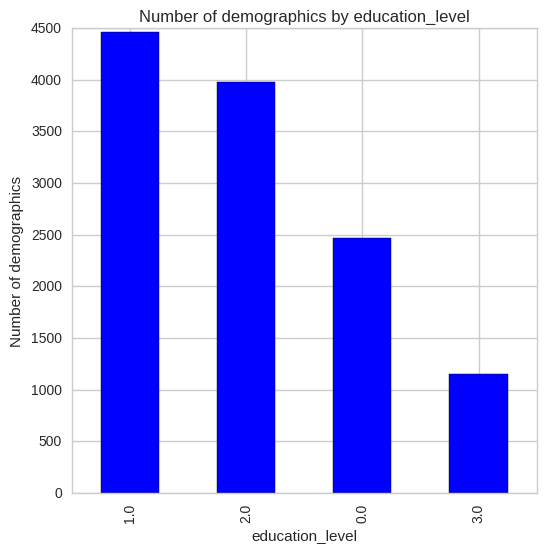

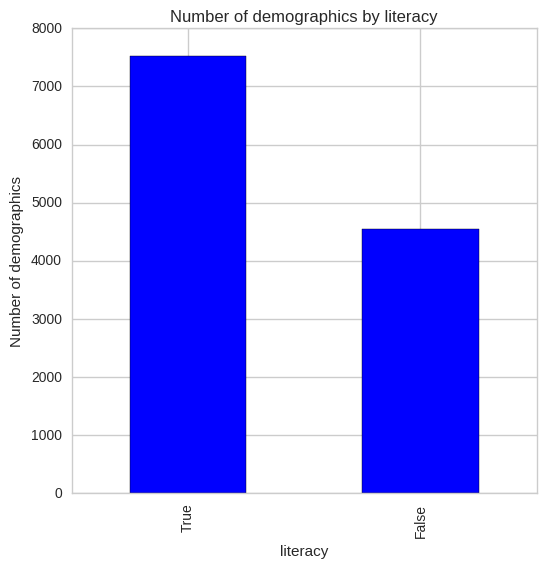

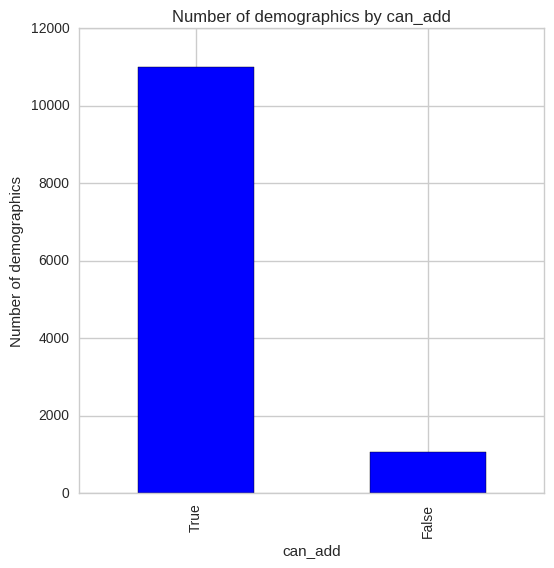

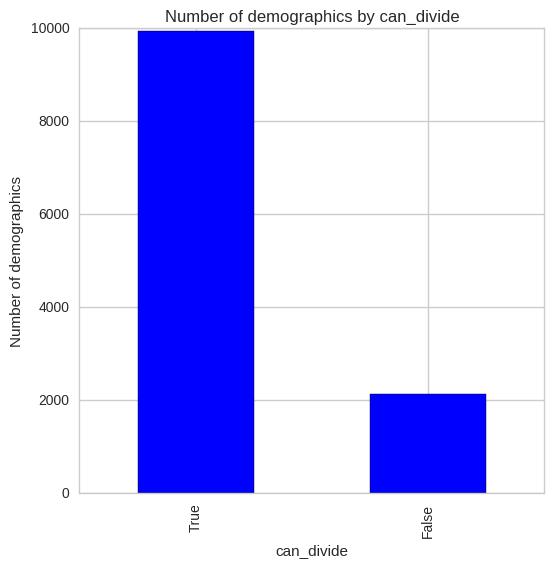

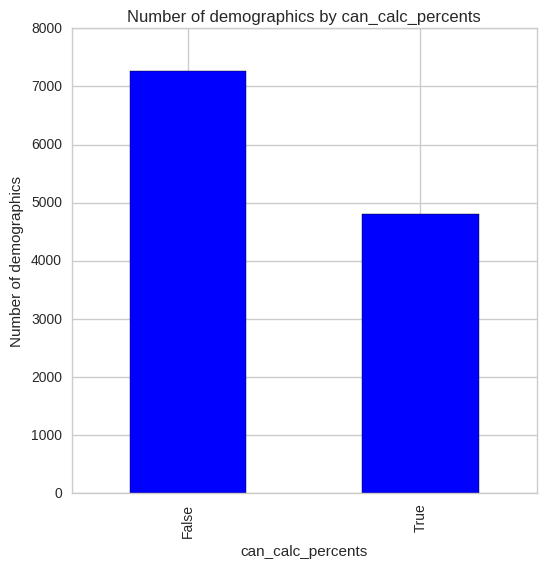

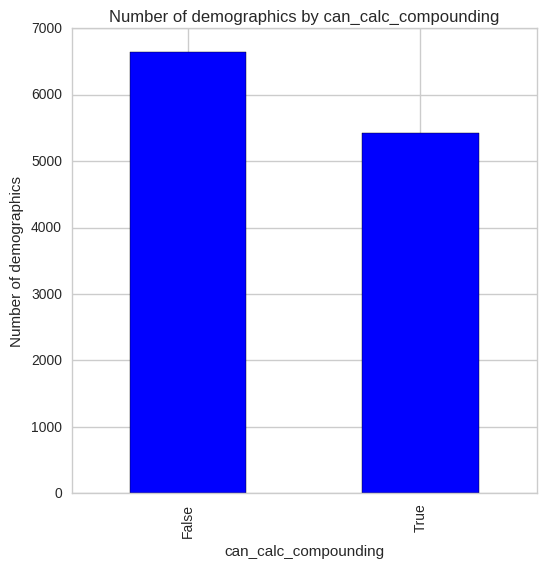

In [63]:
def plot_bars(df, cols):
    for col in cols:
        fig = plt.figure(figsize=(6,6)) # define plot area
        ax = fig.gca() # define axis    
        counts = df[col].value_counts() # find the counts for each unique category
        counts.plot.bar(ax = ax, color = 'blue') # Use the plot.bar method on the counts data frame
        ax.set_title('Number of demographics by ' + col) # Give the plot a main title
        ax.set_xlabel(col) # Set text for the x axis
        ax.set_ylabel('Number of demographics')# Set text for y axis
        plt.show()

plot_bars(df, education_col)

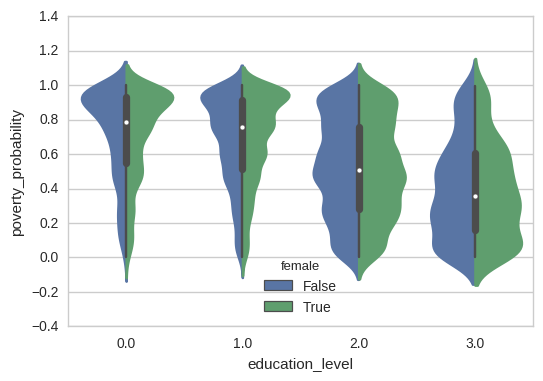

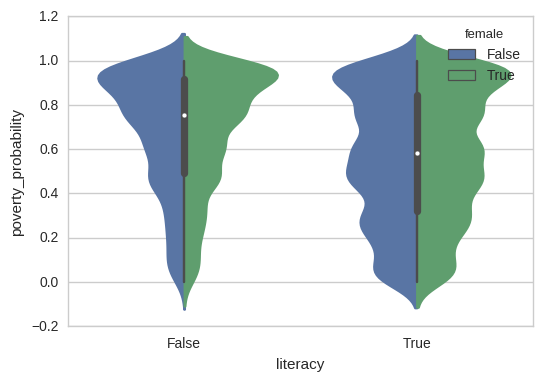

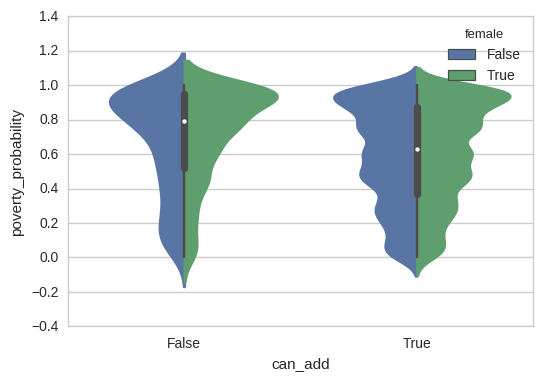

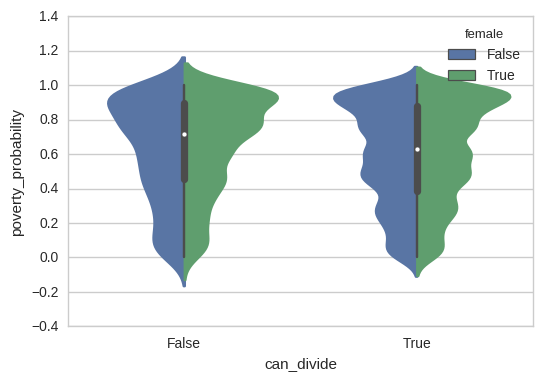

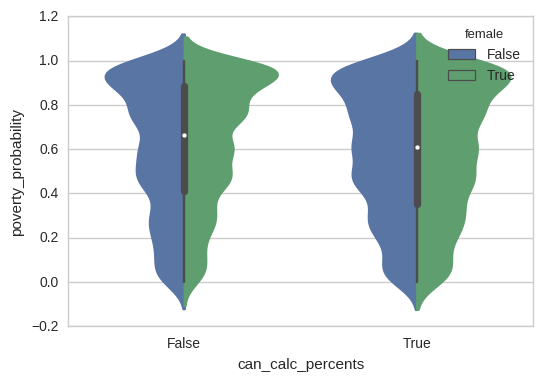

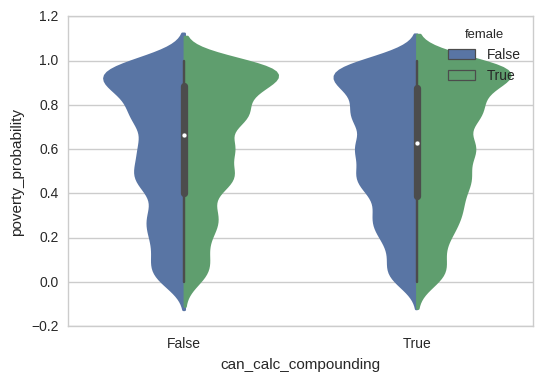

In [64]:
def plot_violin(df, cols, col_y = 'poverty_probability',hue_col = 'female'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.violinplot(col, col_y, data=df, hue = hue_col, split = True)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_violin(df, education_col) 

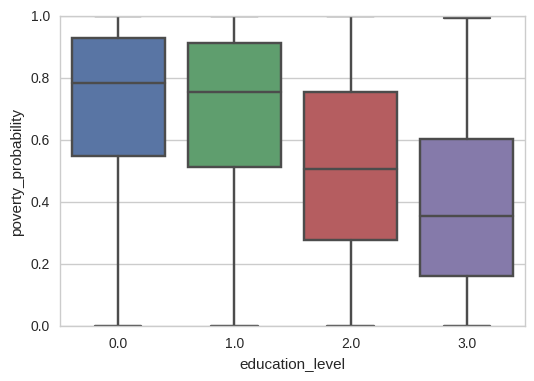

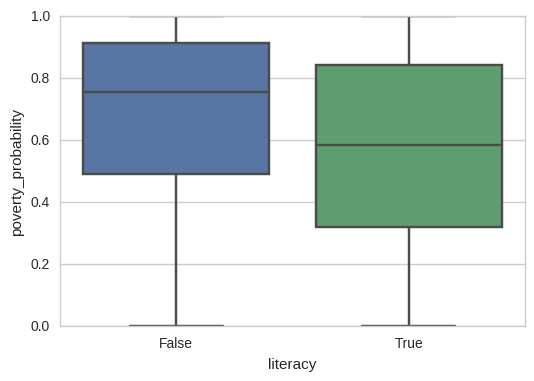

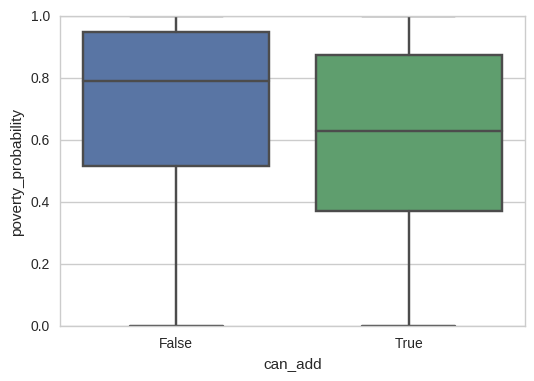

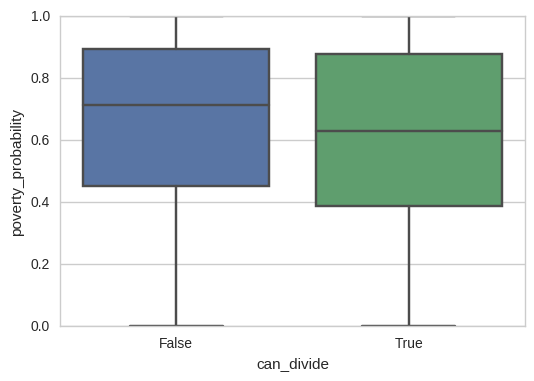

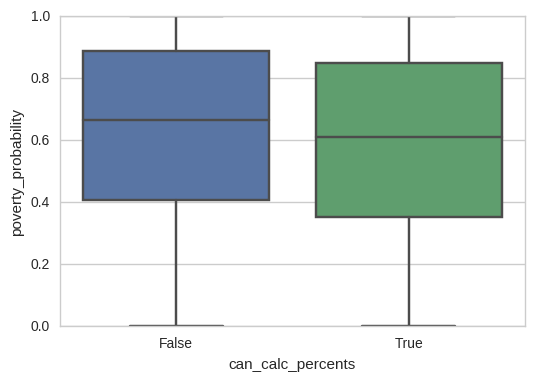

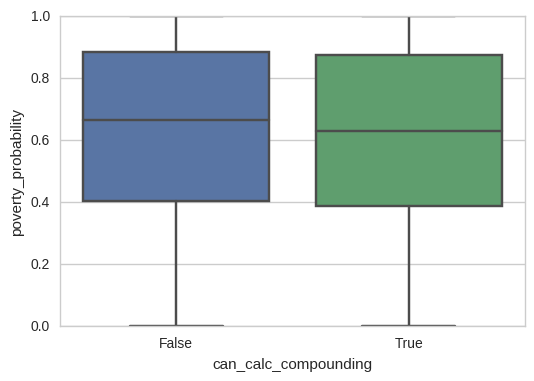

In [65]:
def plot_box(df, cols, col_y = 'poverty_probability'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.boxplot(col, col_y, data=df)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_box(df, education_col)

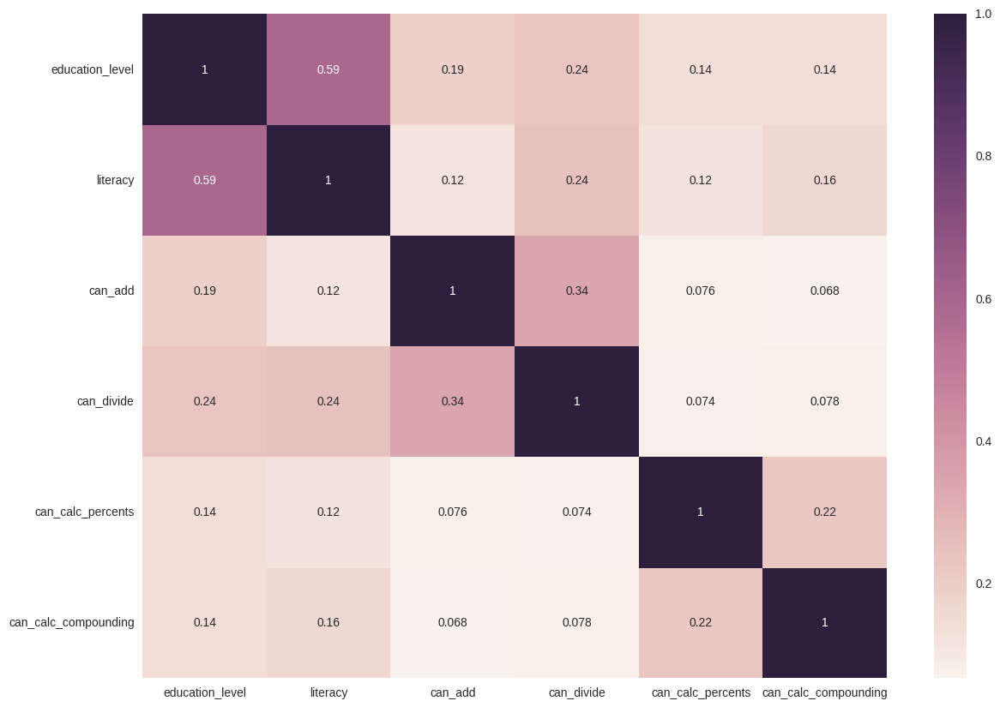

In [66]:
fig, ax = plt.subplots()
fig.set_size_inches(14, 10)

ax=sns.heatmap(df[education_col].corr(),annot=True)

# Employment

In [67]:
df.columns

Index(['row_id', 'country', 'is_urban', 'age', 'female', 'married', 'religion',
       'relationship_to_hh_head', 'education_level', 'literacy', 'can_add',
       'can_divide', 'can_calc_percents', 'can_calc_compounding',
       'employed_last_year', 'employment_category_last_year',
       'employment_type_last_year', 'share_hh_income_provided',
       'income_ag_livestock_last_year', 'income_friends_family_last_year',
       'income_government_last_year', 'income_own_business_last_year',
       'income_private_sector_last_year', 'income_public_sector_last_year',
       'num_times_borrowed_last_year', 'borrowing_recency', 'formal_savings',
       'informal_savings', 'cash_property_savings', 'has_insurance',
       'has_investment', 'num_shocks_last_year',
       'avg_shock_strength_last_year', 'borrowed_for_emergency_last_year',
       'borrowed_for_daily_expenses_last_year',
       'borrowed_for_home_or_biz_last_year', 'phone_technology', 'can_call',
       'can_text', 'can_use_intern

In [68]:
employment_col = ['employed_last_year', 'employment_category_last_year', 'employment_type_last_year', 'share_hh_income_provided', 'income_ag_livestock_last_year', 'income_friends_family_last_year', 'income_government_last_year', 'income_own_business_last_year', 'income_private_sector_last_year', 'income_public_sector_last_year']

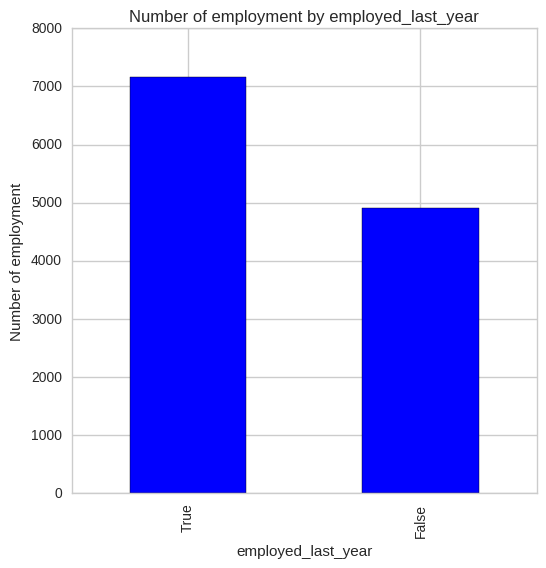

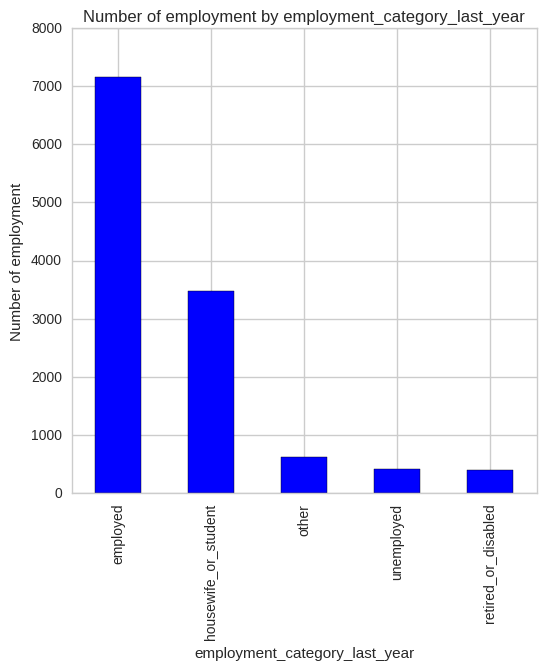

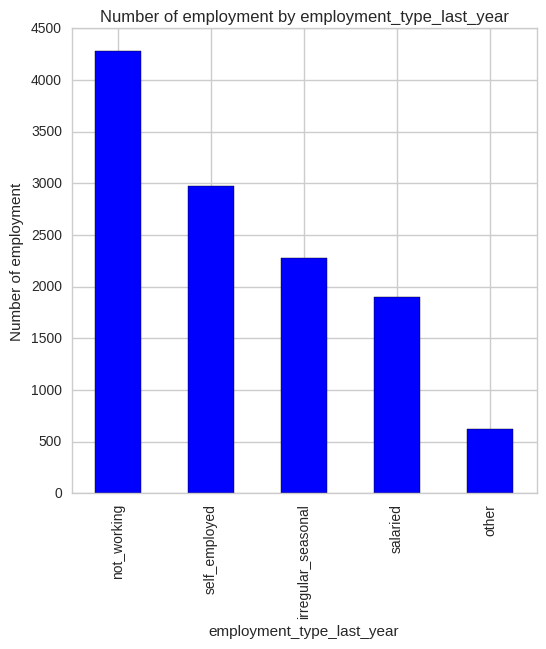

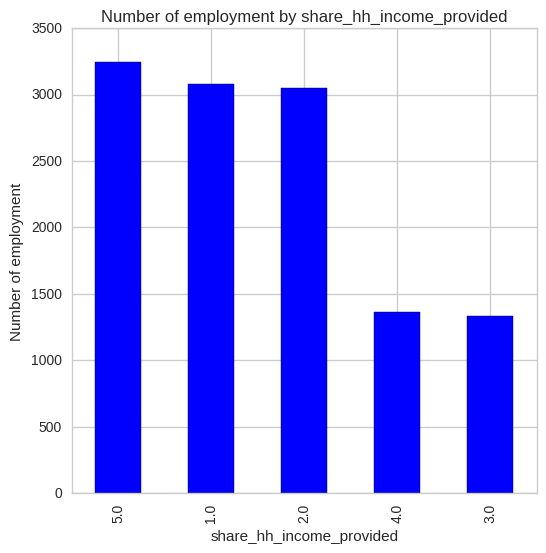

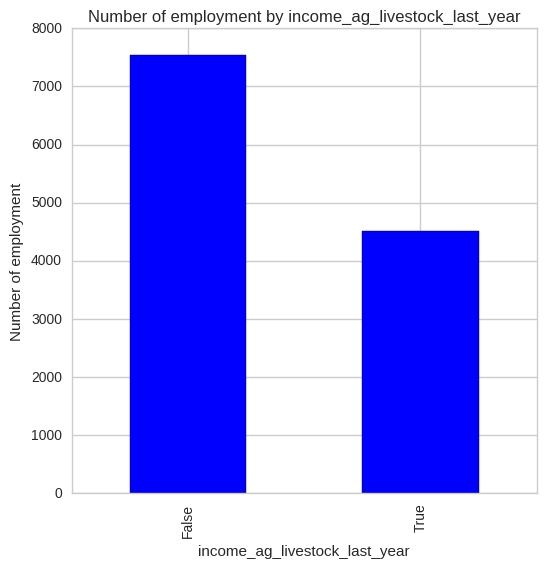

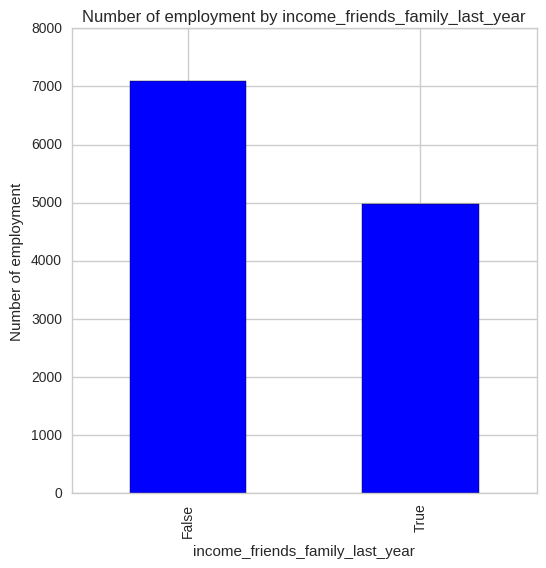

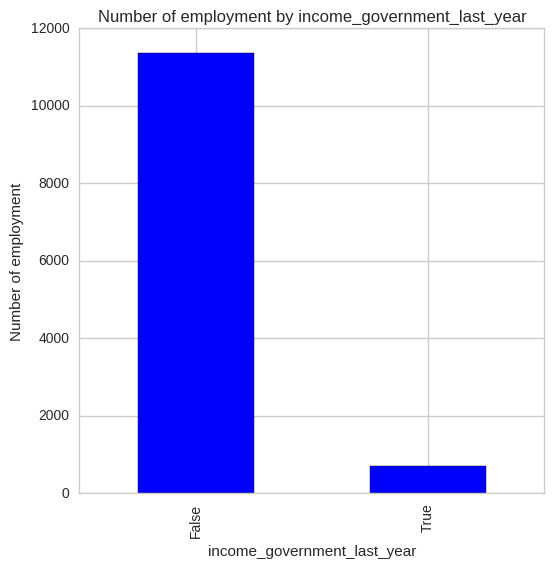

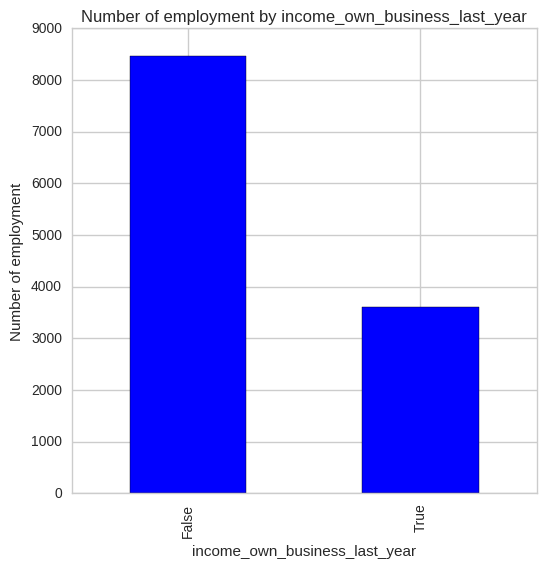

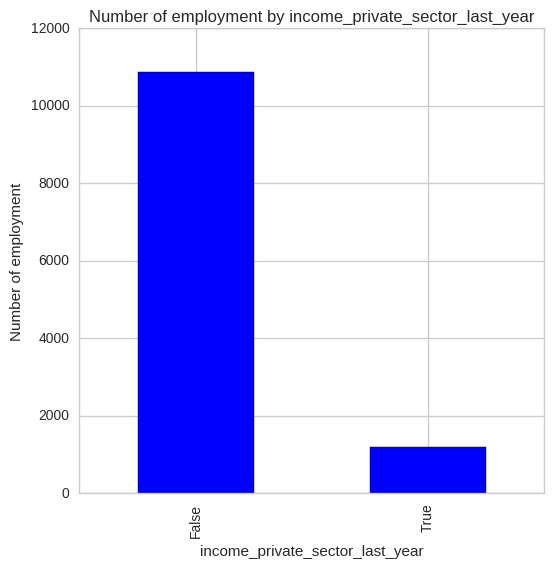

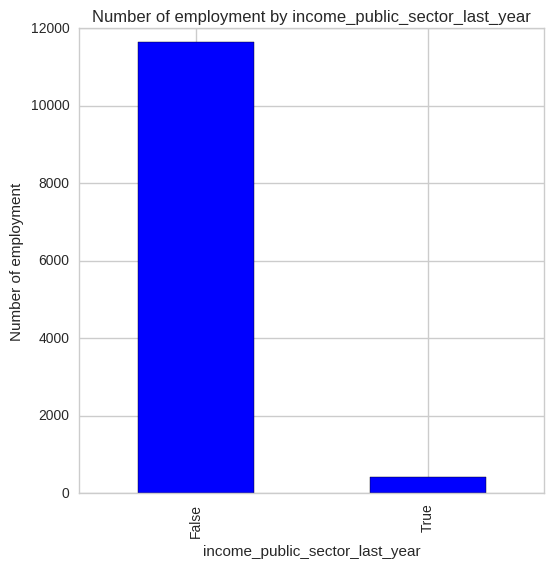

In [69]:
def plot_bars(df, cols):
    for col in cols:
        fig = plt.figure(figsize=(6,6)) # define plot area
        ax = fig.gca() # define axis    
        counts = df[col].value_counts() # find the counts for each unique category
        counts.plot.bar(ax = ax, color = 'blue') # Use the plot.bar method on the counts data frame
        ax.set_title('Number of employment by ' + col) # Give the plot a main title
        ax.set_xlabel(col) # Set text for the x axis
        ax.set_ylabel('Number of employment')# Set text for y axis
        plt.show()

plot_bars(df, employment_col)

In [70]:
def count_unique(df, cols):
    for col in cols:
        print('\n' + 'For column ' + col)
        print(df[col].value_counts())

count_unique(df, employment_col)


For column employed_last_year
True     7158
False    4910
Name: employed_last_year, dtype: int64

For column employment_category_last_year
employed                7158
housewife_or_student    3469
other                    626
unemployed               422
retired_or_disabled      393
Name: employment_category_last_year, dtype: int64

For column employment_type_last_year
not_working           4284
self_employed         2977
irregular_seasonal    2280
salaried              1901
other                  626
Name: employment_type_last_year, dtype: int64

For column share_hh_income_provided
5.0    3243
1.0    3077
2.0    3046
4.0    1366
3.0    1336
Name: share_hh_income_provided, dtype: int64

For column income_ag_livestock_last_year
False    7548
True     4520
Name: income_ag_livestock_last_year, dtype: int64

For column income_friends_family_last_year
False    7096
True     4972
Name: income_friends_family_last_year, dtype: int64

For column income_government_last_year
False    11371
True 

In [71]:
df.dtypes

row_id                                      int64
country                                    object
is_urban                                     bool
age                                       float64
female                                       bool
married                                      bool
religion                                   object
relationship_to_hh_head                    object
education_level                           float64
literacy                                     bool
can_add                                      bool
can_divide                                   bool
can_calc_percents                            bool
can_calc_compounding                         bool
employed_last_year                           bool
employment_category_last_year              object
employment_type_last_year                  object
share_hh_income_provided                  float64
income_ag_livestock_last_year                bool
income_friends_family_last_year              bool


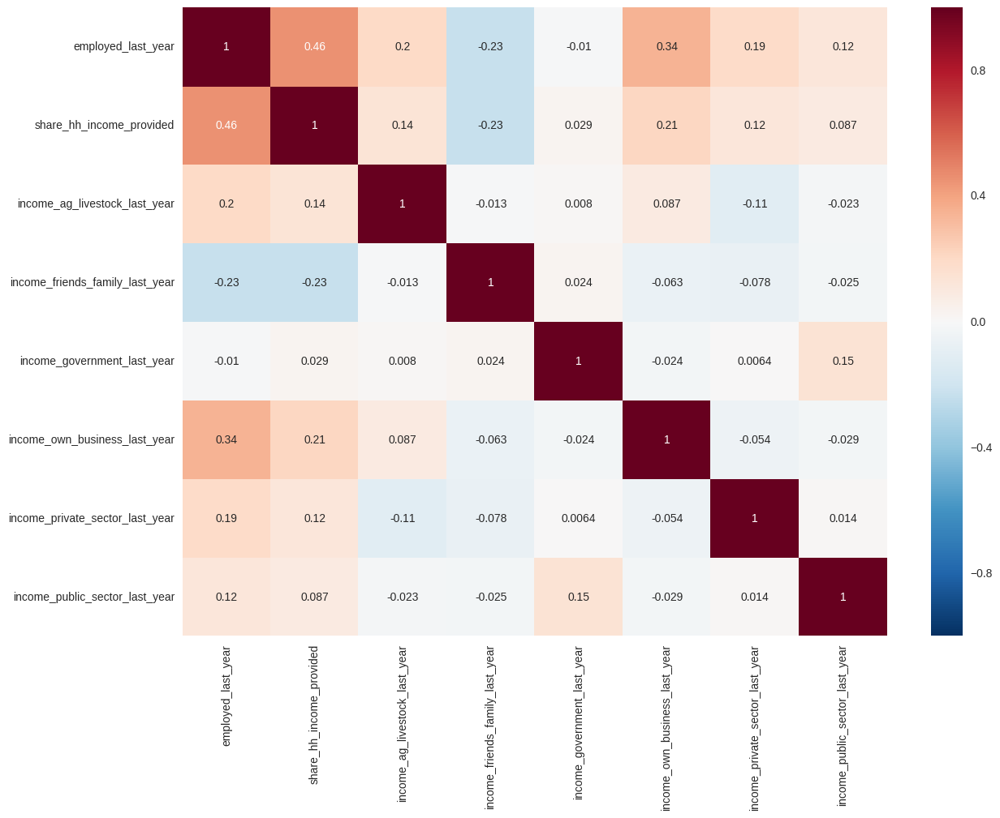

In [72]:
fig, ax = plt.subplots()
fig.set_size_inches(14, 10)

ax=sns.heatmap(df[employment_col].corr(),annot=True)

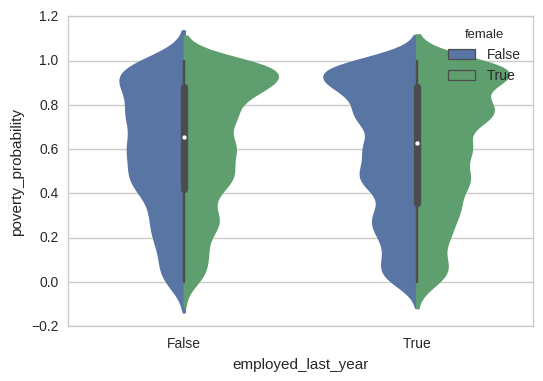

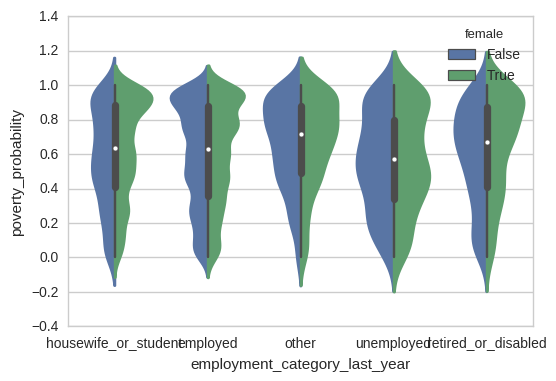

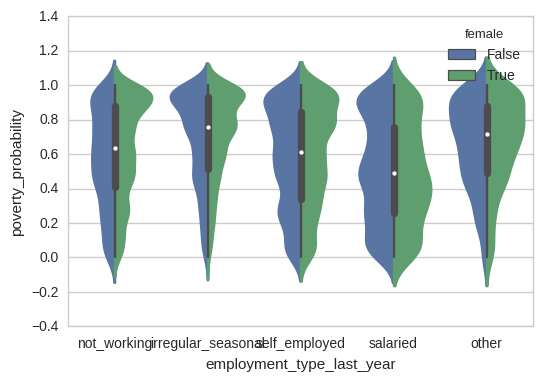

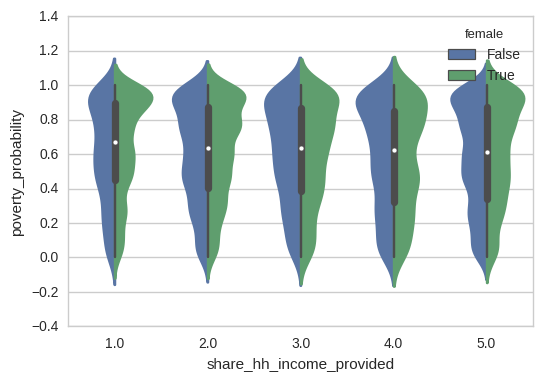

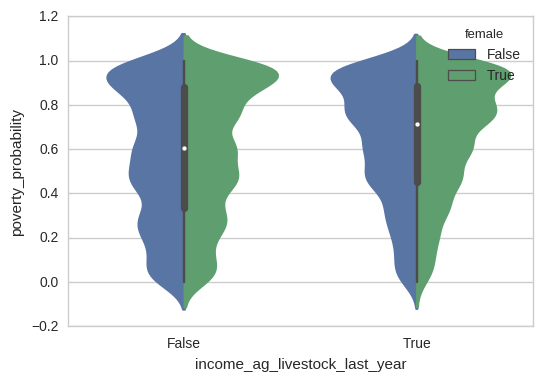

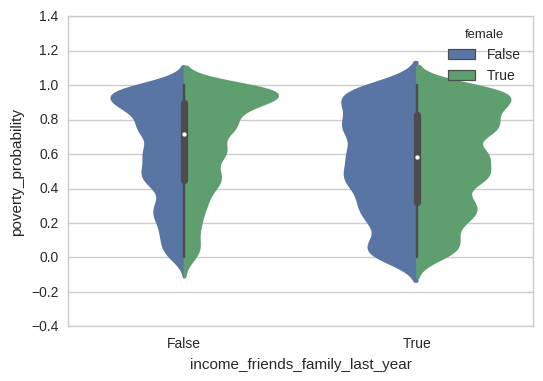

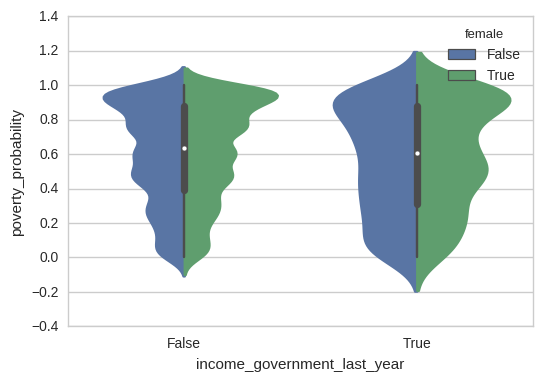

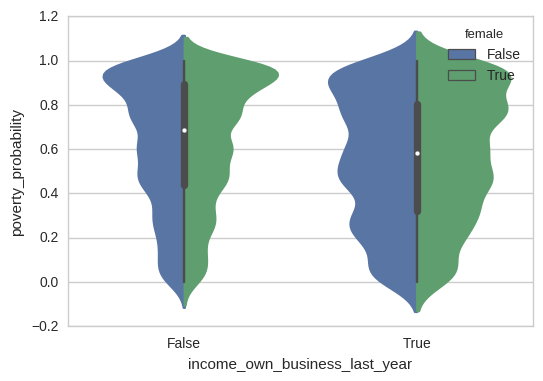

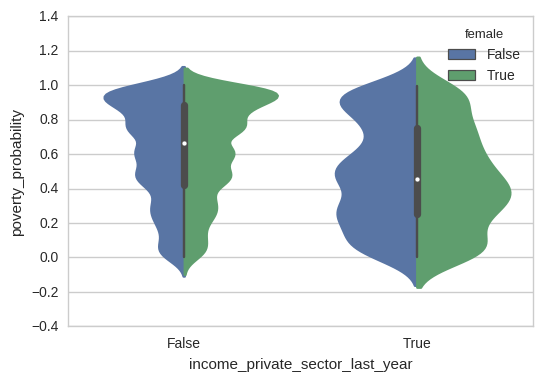

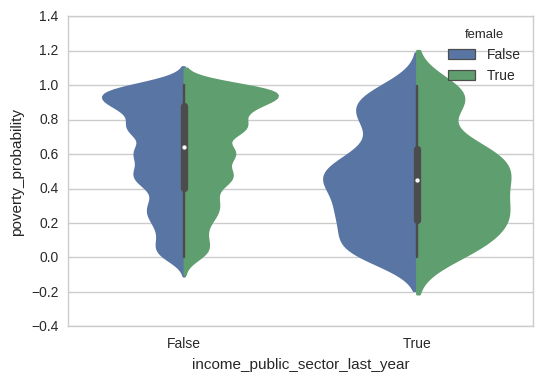

In [73]:
def plot_violin(df, cols, col_y = 'poverty_probability',hue_col = 'female'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.violinplot(col, col_y, data=df, hue = hue_col, split = True)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_violin(df, employment_col) 

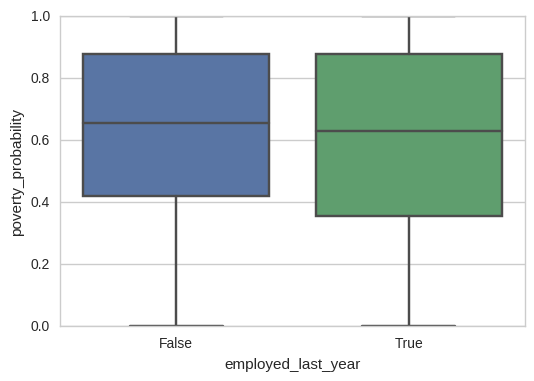

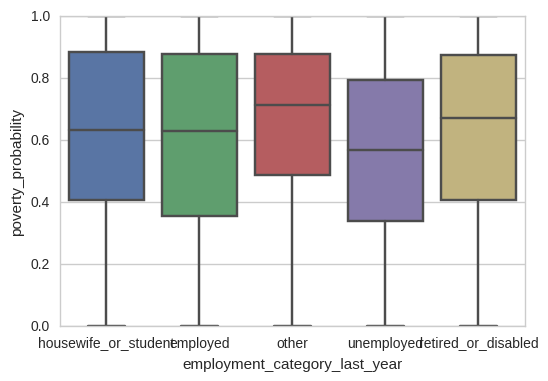

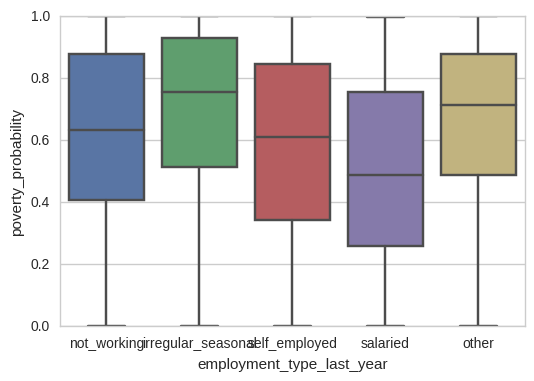

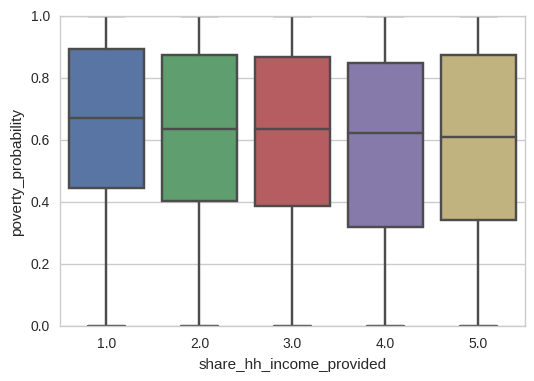

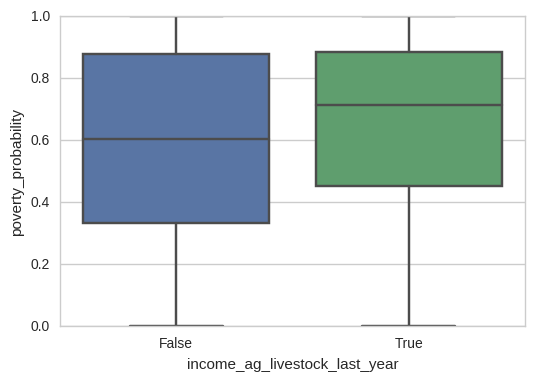

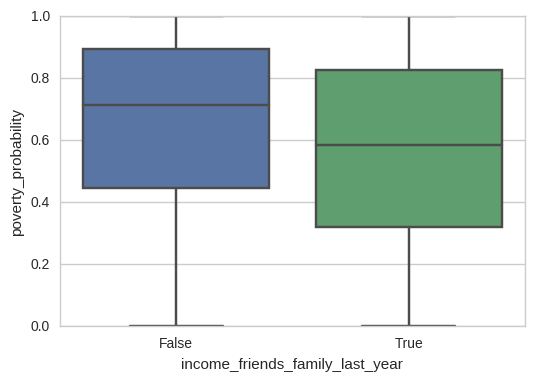

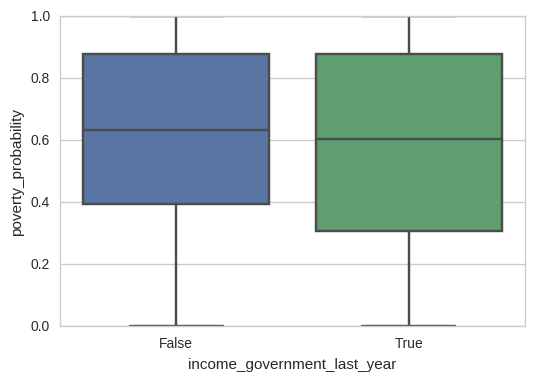

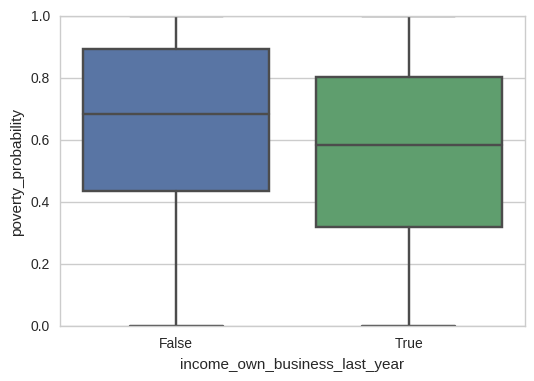

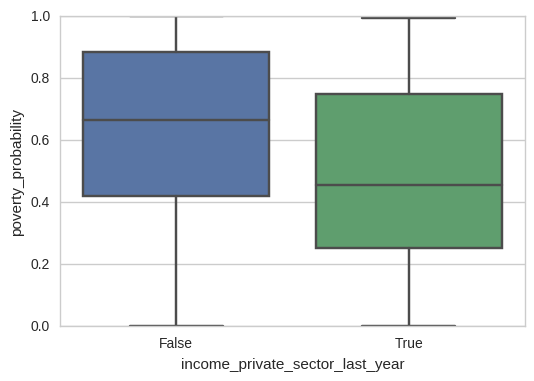

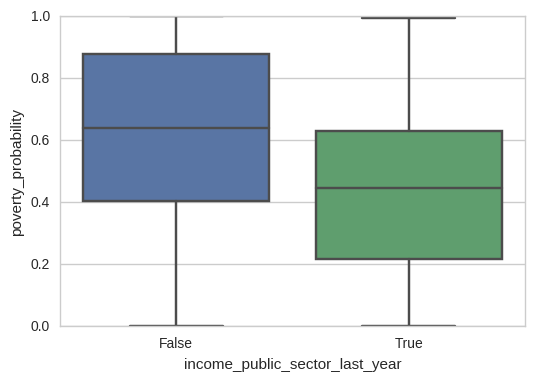

In [74]:
def plot_box(df, cols, col_y = 'poverty_probability'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.boxplot(col, col_y, data=df)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_box(df, employment_col)

# Economic

In [75]:
economic_col = ['num_times_borrowed_last_year', 'borrowing_recency', 'formal_savings',
       'informal_savings', 'cash_property_savings', 'has_insurance',
       'has_investment', 'num_shocks_last_year',
       'avg_shock_strength_last_year', 'borrowed_for_emergency_last_year',
       'borrowed_for_daily_expenses_last_year',
       'borrowed_for_home_or_biz_last_year']

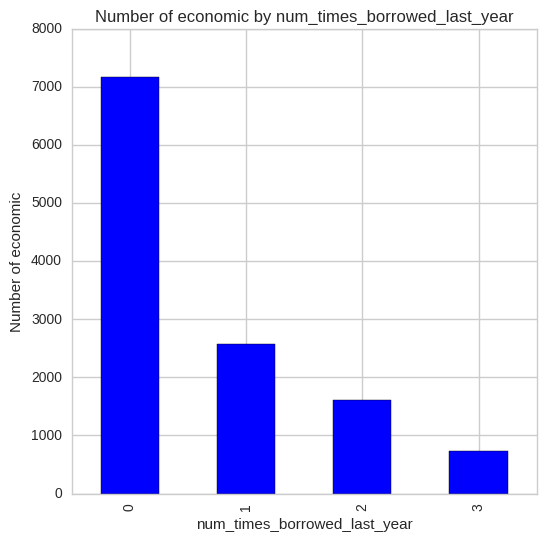

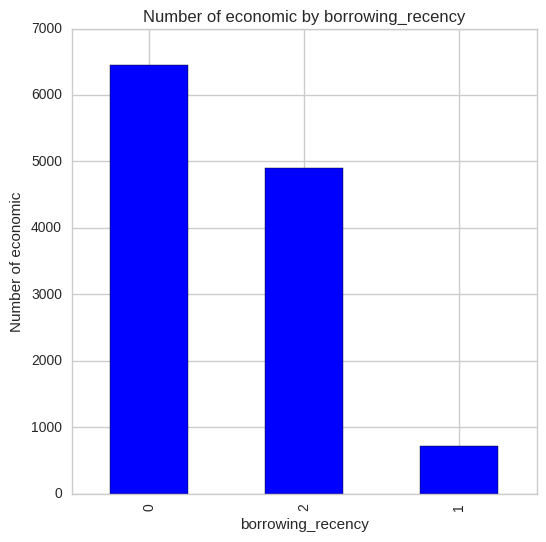

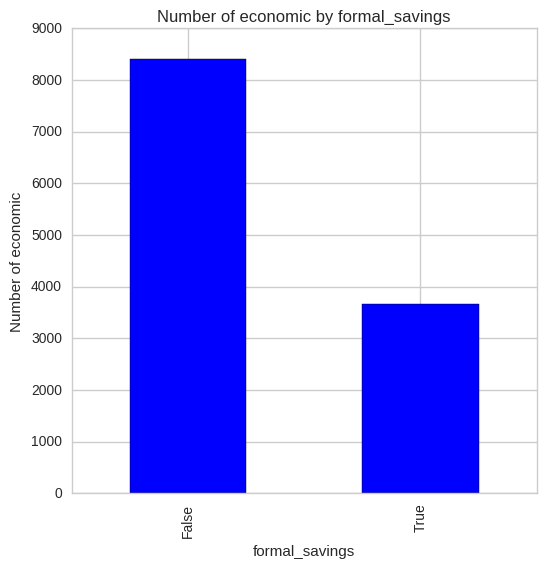

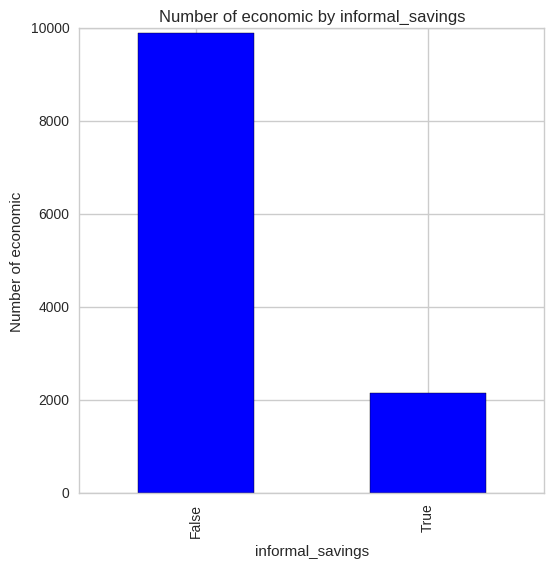

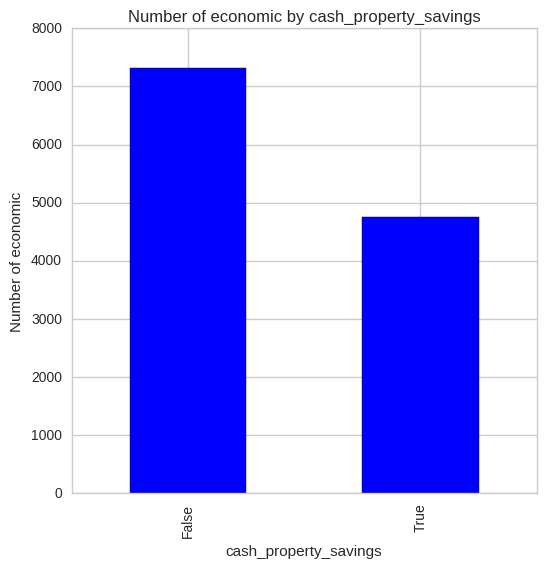

...

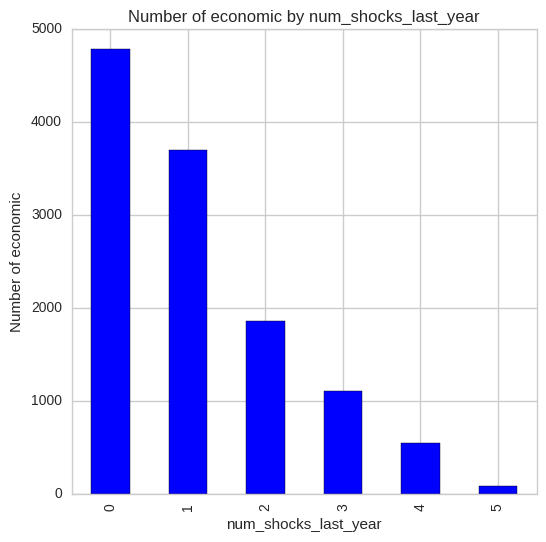

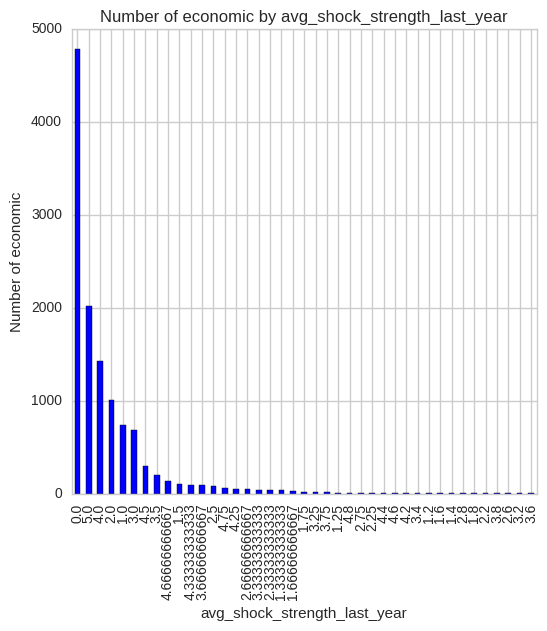

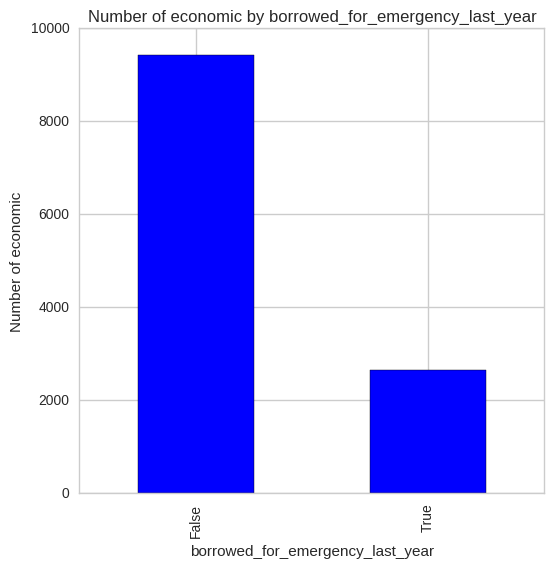

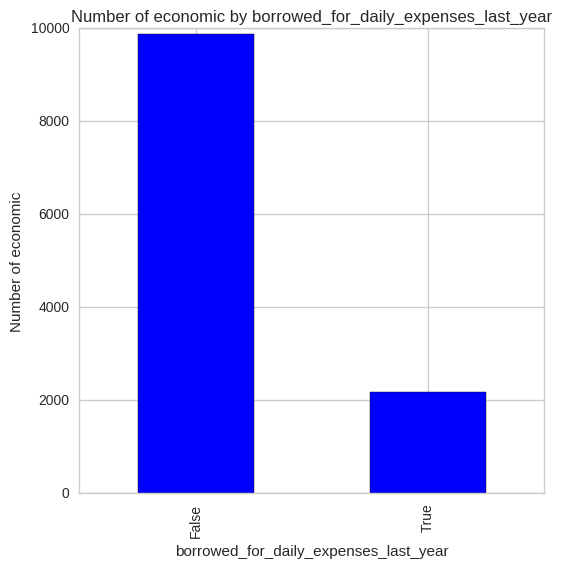

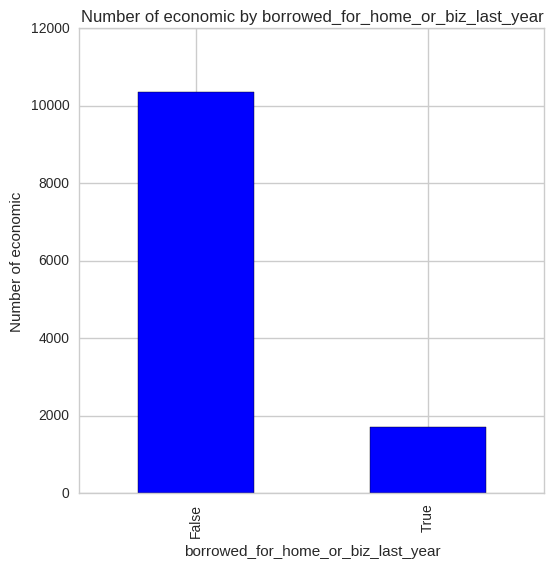

In [76]:
def plot_bars(df, cols):
    for col in cols:
        fig = plt.figure(figsize=(6,6)) # define plot area
        ax = fig.gca() # define axis    
        counts = df[col].value_counts() # find the counts for each unique category
        counts.plot.bar(ax = ax, color = 'blue') # Use the plot.bar method on the counts data frame
        ax.set_title('Number of economic by ' + col) # Give the plot a main title
        ax.set_xlabel(col) # Set text for the x axis
        ax.set_ylabel('Number of economic')# Set text for y axis
        plt.show()

plot_bars(df, economic_col)

In [77]:
def count_unique(df, cols):
    for col in cols:
        print('\n' + 'For column ' + col)
        print(df[col].value_counts())

count_unique(df, economic_col)


For column num_times_borrowed_last_year
0    7167
1    2567
2    1603
3     731
Name: num_times_borrowed_last_year, dtype: int64

For column borrowing_recency
0    6445
2    4901
1     722
Name: borrowing_recency, dtype: int64

For column formal_savings
False    8405
True     3663
Name: formal_savings, dtype: int64

For column informal_savings
False    9902
True     2166
Name: informal_savings, dtype: int64

For column cash_property_savings
False    7315
True     4753
Name: cash_property_savings, dtype: int64

For column has_insurance
False    10454
True      1614
Name: has_insurance, dtype: int64

For column has_investment
False    8394
True     3674
Name: has_investment, dtype: int64

For column num_shocks_last_year
0    4780
1    3696
2    1861
3    1105
4     545
5      81
Name: num_shocks_last_year, dtype: int64

For column avg_shock_strength_last_year
0.000000    4780
5.000000    2013
4.000000    1423
2.000000    1010
1.000000     742
3.000000     680
4.500000     300
3.500000  

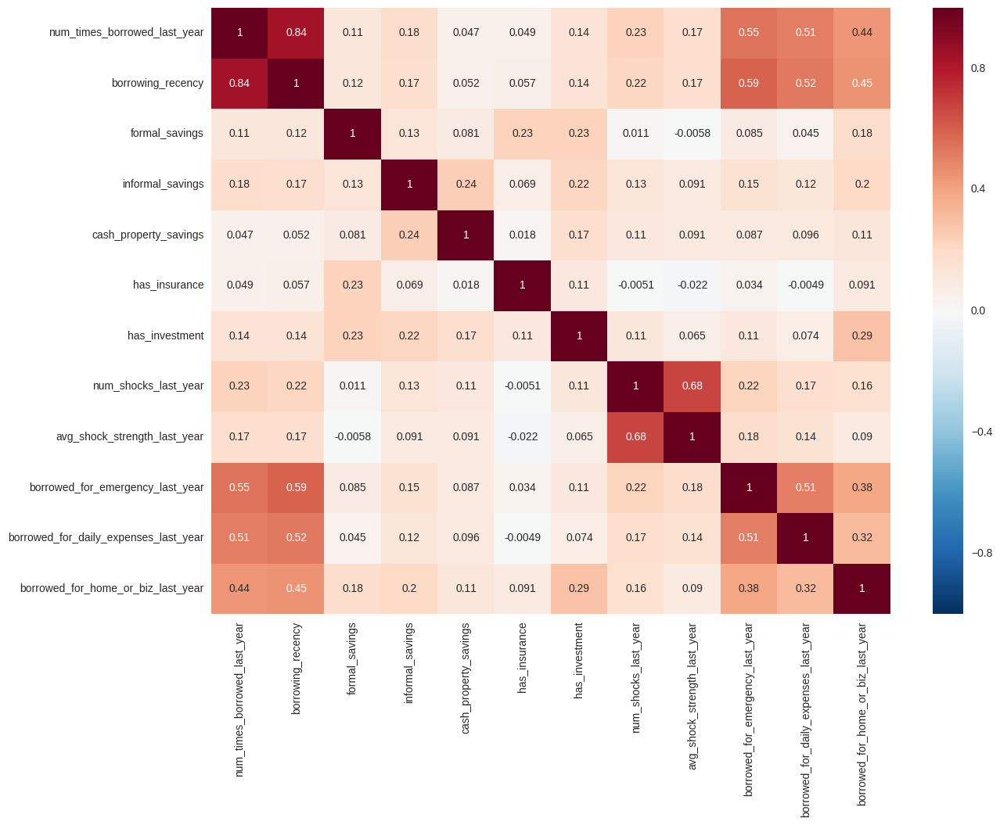

In [78]:
fig, ax = plt.subplots()
fig.set_size_inches(14, 10)

ax=sns.heatmap(df[economic_col].corr(),annot=True)

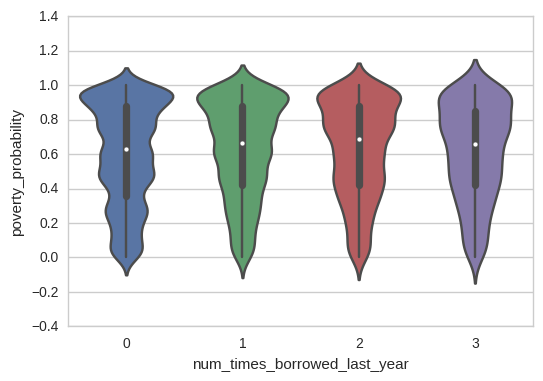

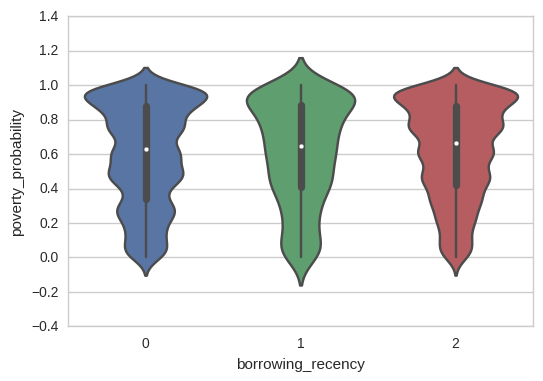

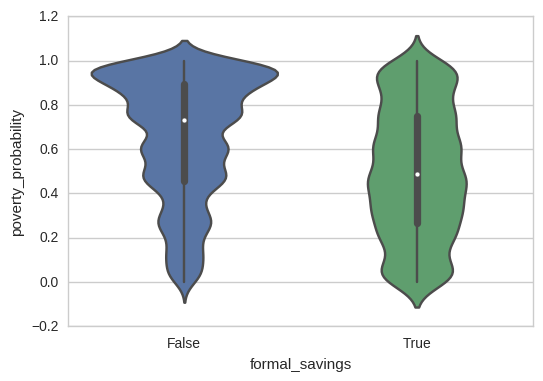

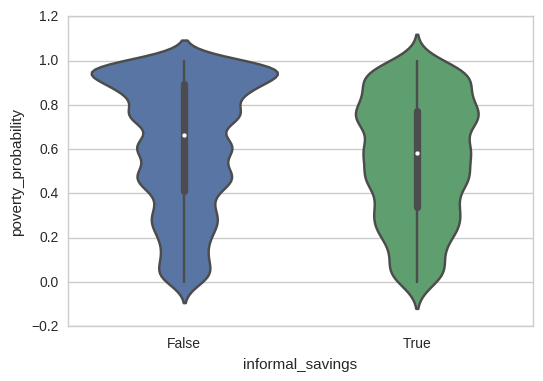

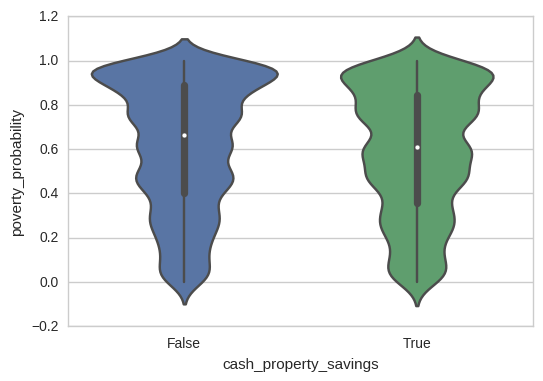

...

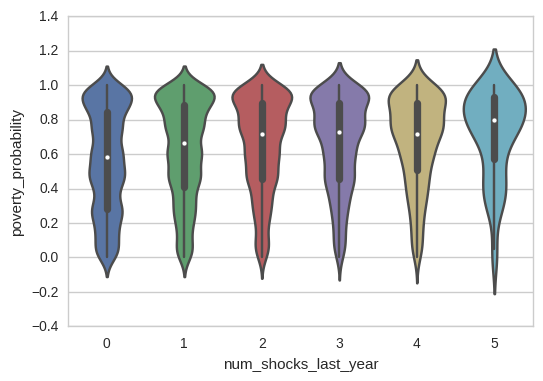

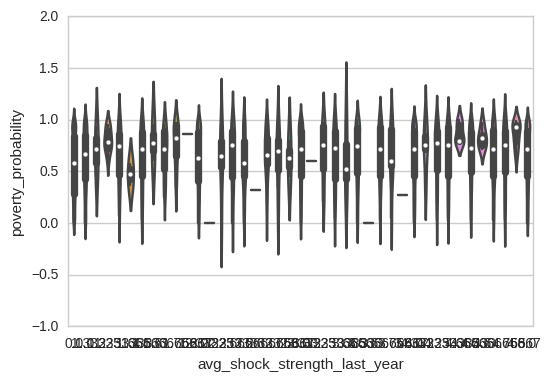

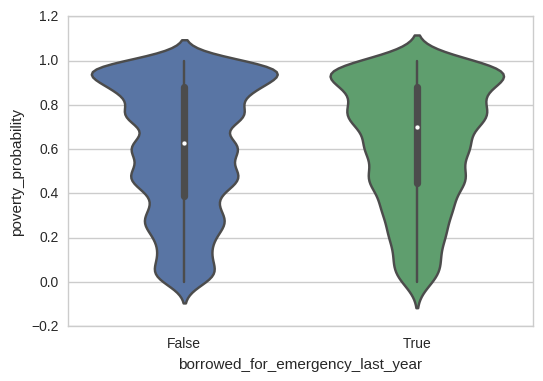

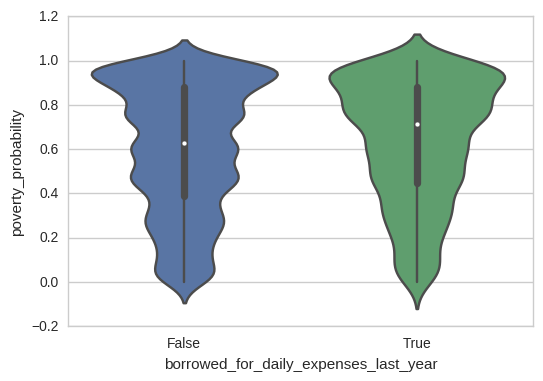

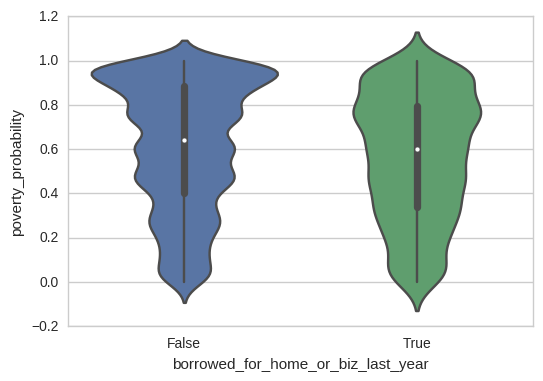

In [79]:
def plot_violin(df, cols, col_y = 'poverty_probability'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.violinplot(col, col_y, data=df)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_violin(df, economic_col) 

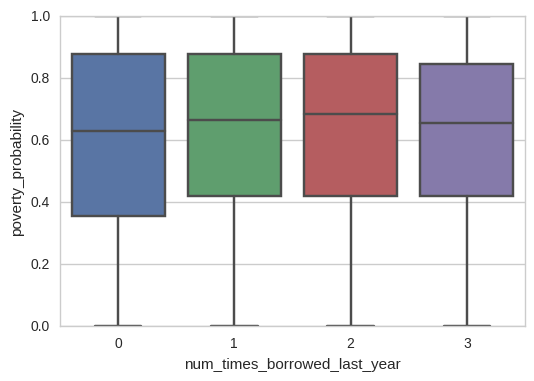

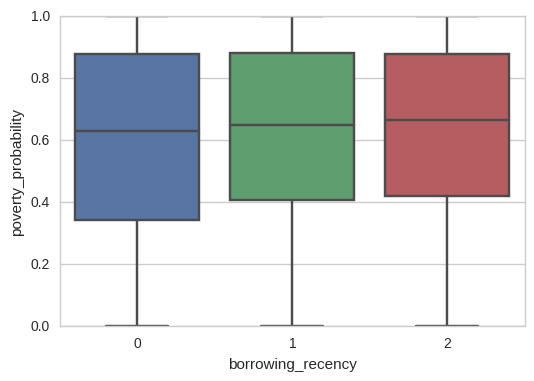

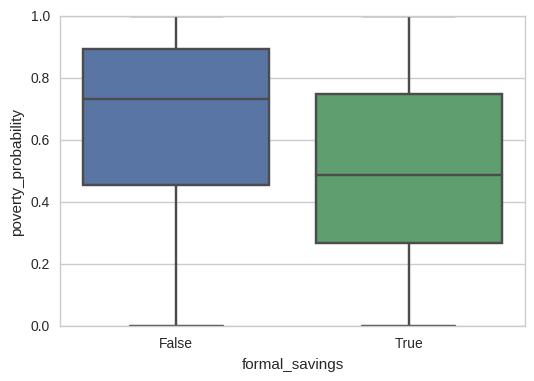

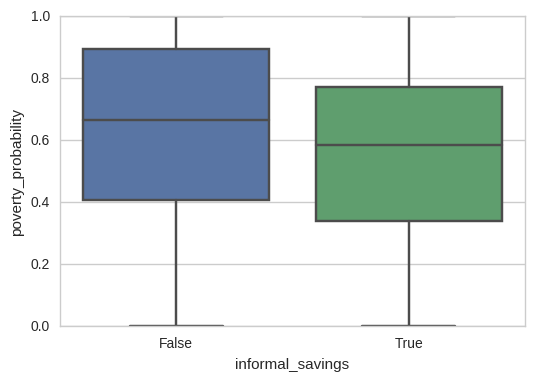

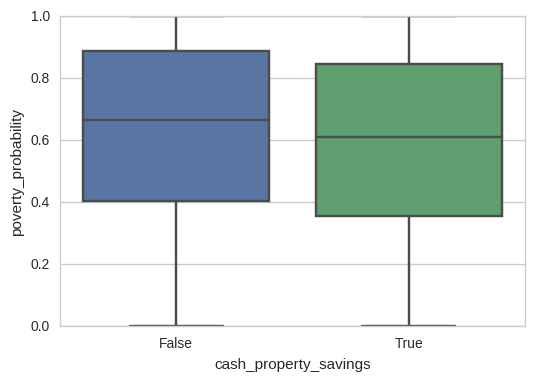

...

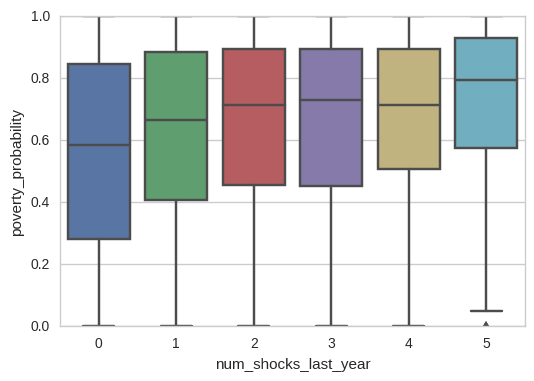

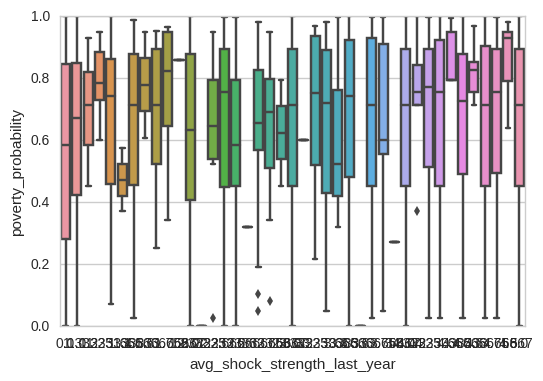

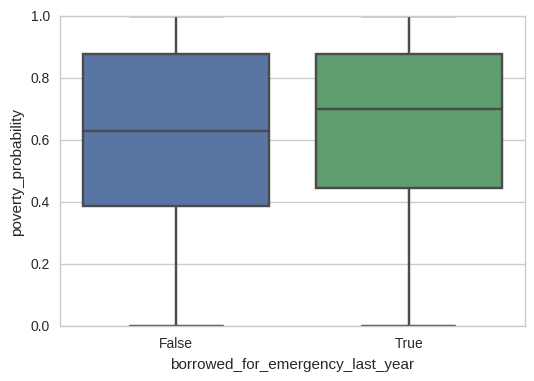

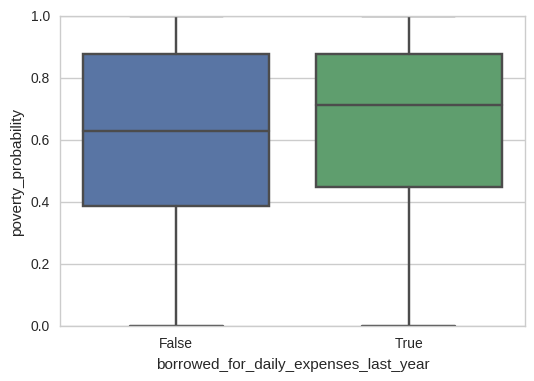

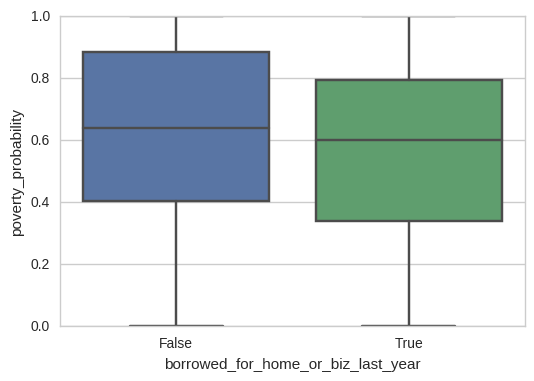

In [80]:
def plot_box(df, cols, col_y = 'poverty_probability'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.boxplot(col, col_y, data=df)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_box(df, economic_col)

# Phone

In [81]:
phone_col = ['phone_technology', 'can_call',
       'can_text', 'can_use_internet', 'can_make_transaction',
       'phone_ownership', 'advanced_phone_use', ]

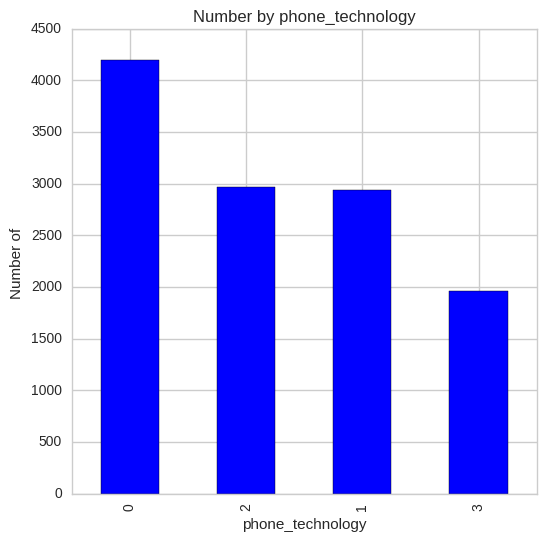

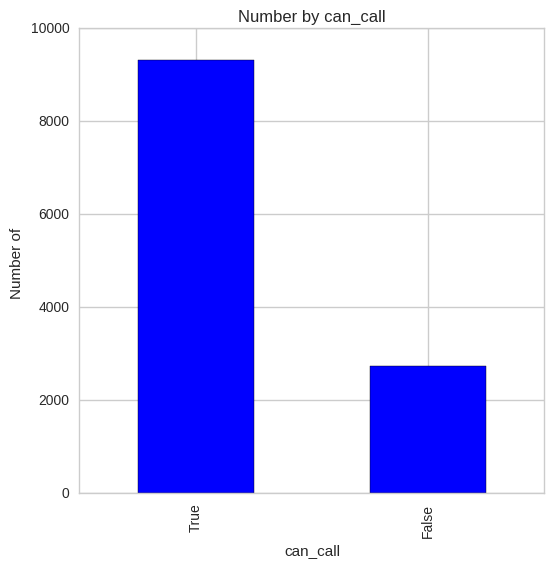

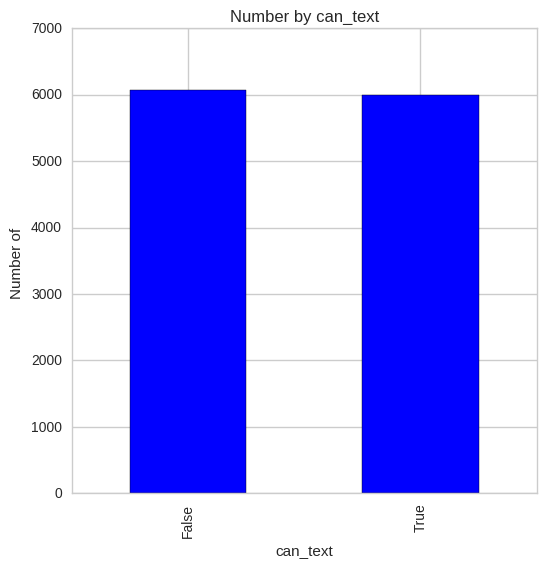

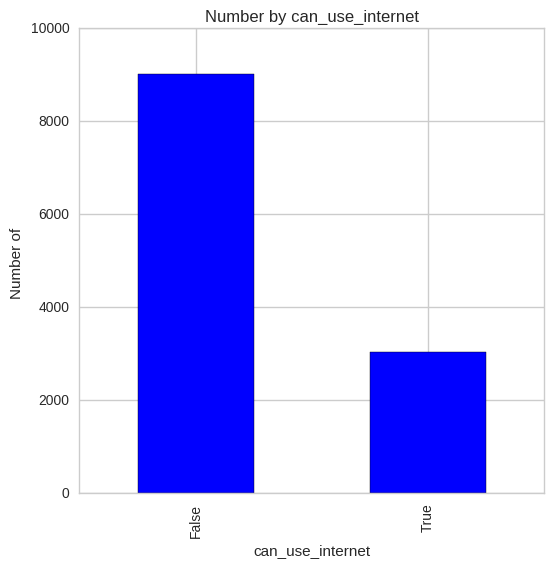

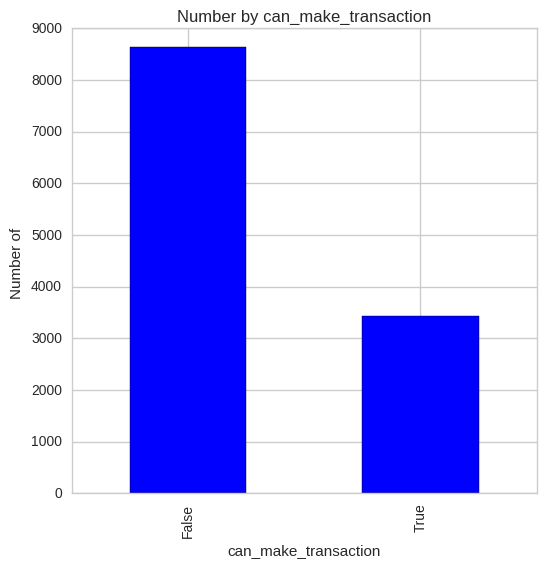

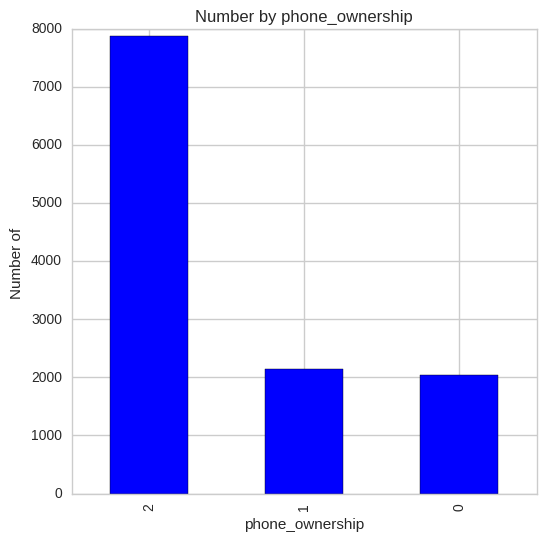

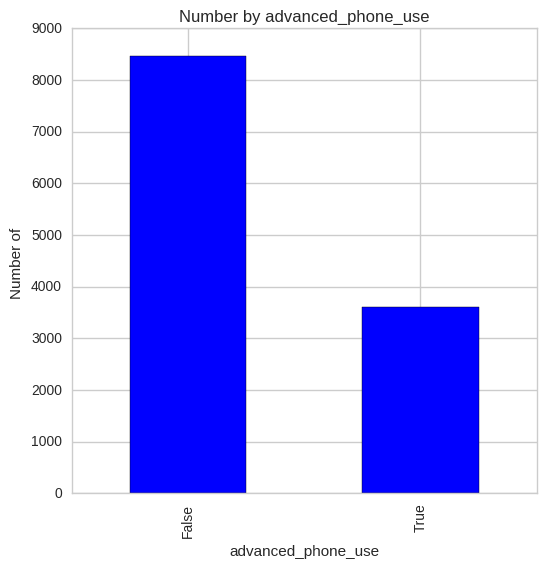

In [82]:
def plot_bars(df, cols):
    for col in cols:
        fig = plt.figure(figsize=(6,6)) # define plot area
        ax = fig.gca() # define axis    
        counts = df[col].value_counts() # find the counts for each unique category
        counts.plot.bar(ax = ax, color = 'blue') # Use the plot.bar method on the counts data frame
        ax.set_title('Number by ' + col) # Give the plot a main title
        ax.set_xlabel(col) # Set text for the x axis
        ax.set_ylabel('Number of ')# Set text for y axis
        plt.show()

plot_bars(df, phone_col)

In [83]:
def count_unique(df, cols):
    for col in cols:
        print('\n' + 'For column ' + col)
        print(df[col].value_counts())

count_unique(df, phone_col)


For column phone_technology
0    4198
2    2969
1    2939
3    1962
Name: phone_technology, dtype: int64

For column can_call
True     9326
False    2742
Name: can_call, dtype: int64

For column can_text
False    6079
True     5989
Name: can_text, dtype: int64

For column can_use_internet
False    9019
True     3049
Name: can_use_internet, dtype: int64

For column can_make_transaction
False    8636
True     3432
Name: can_make_transaction, dtype: int64

For column phone_ownership
2    7871
1    2149
0    2048
Name: phone_ownership, dtype: int64

For column advanced_phone_use
False    8455
True     3613
Name: advanced_phone_use, dtype: int64


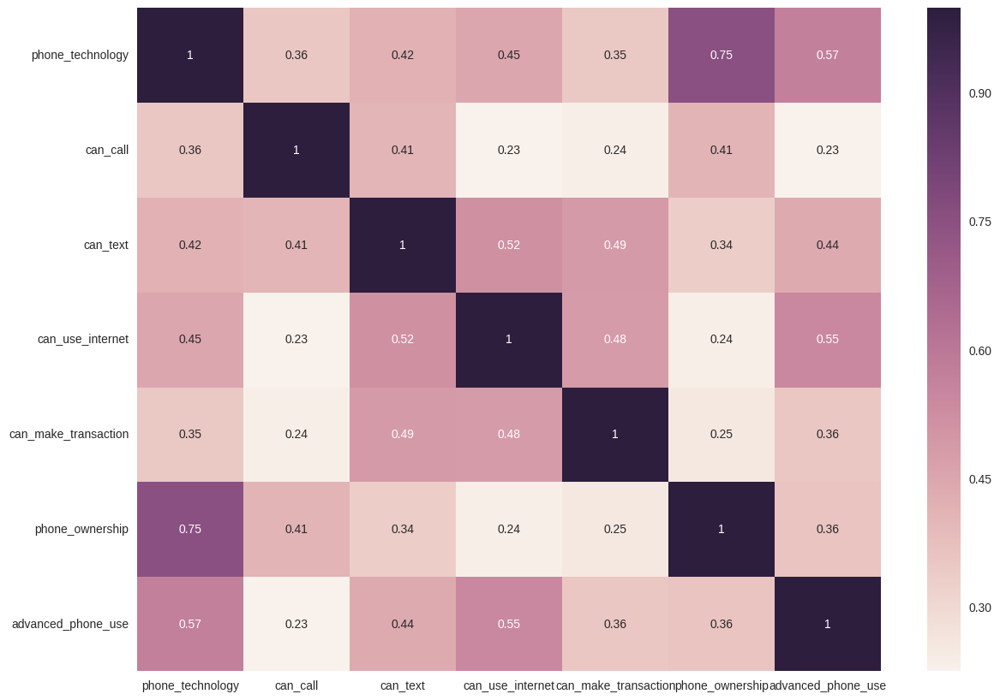

In [84]:
fig, ax = plt.subplots()
fig.set_size_inches(14, 10)

ax=sns.heatmap(df[phone_col].corr(),annot=True)

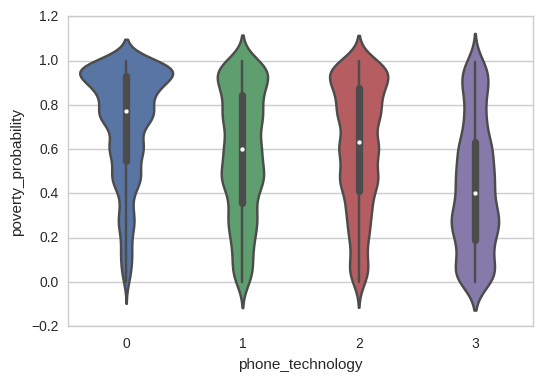

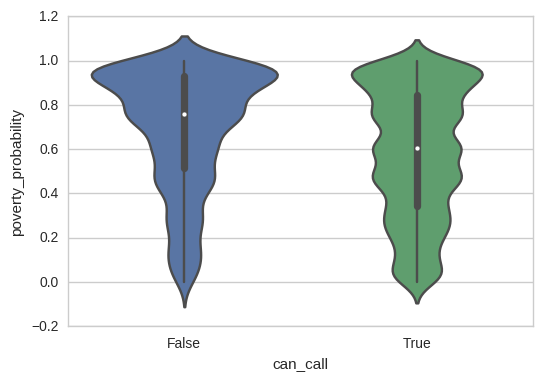

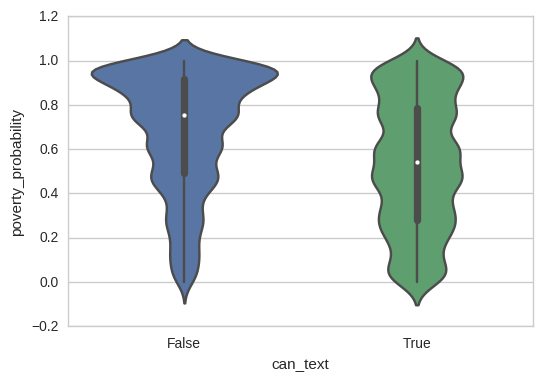

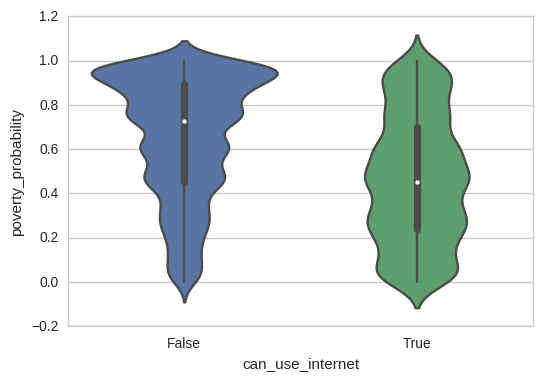

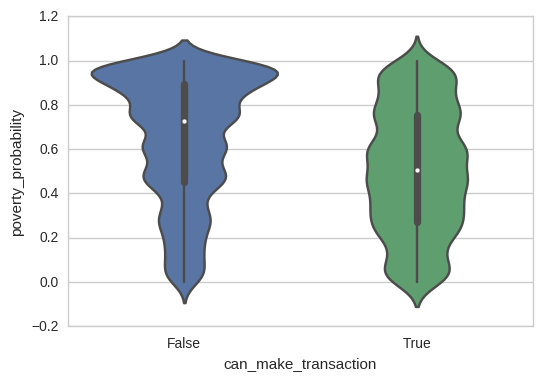

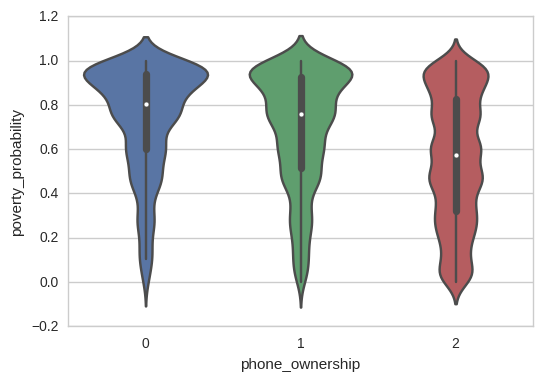

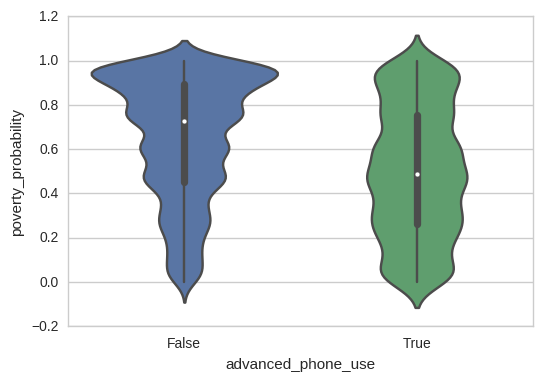

In [85]:
def plot_violin(df, cols, col_y = 'poverty_probability'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.violinplot(col, col_y, data=df)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_violin(df, phone_col) 

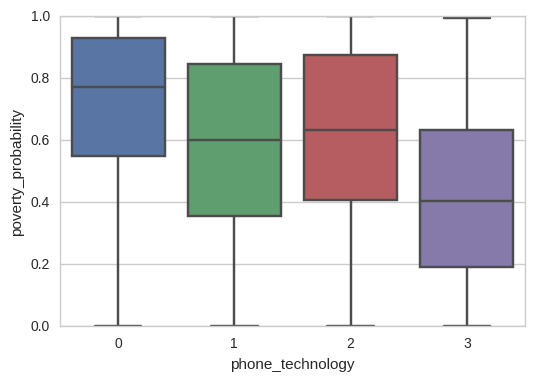

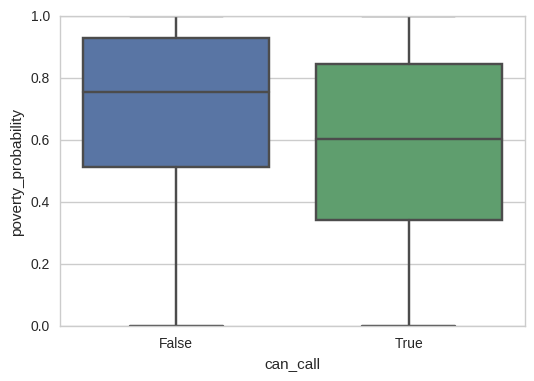

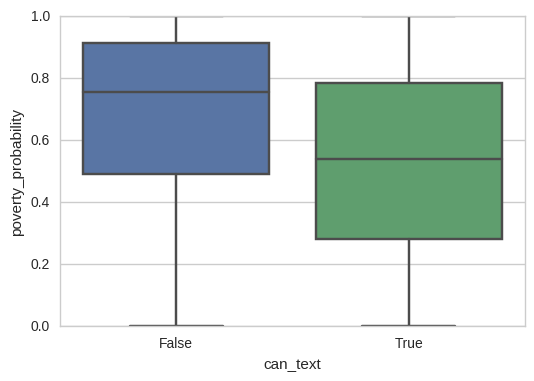

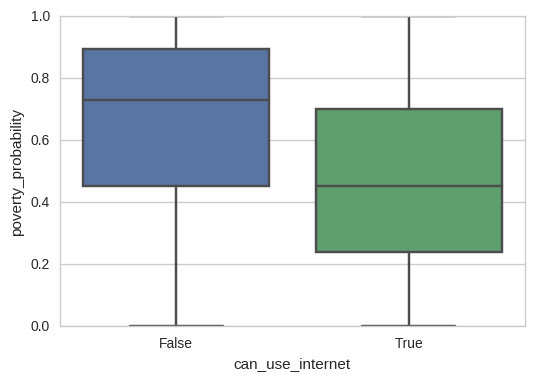

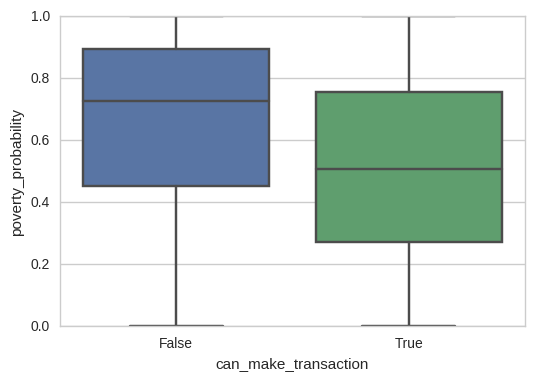

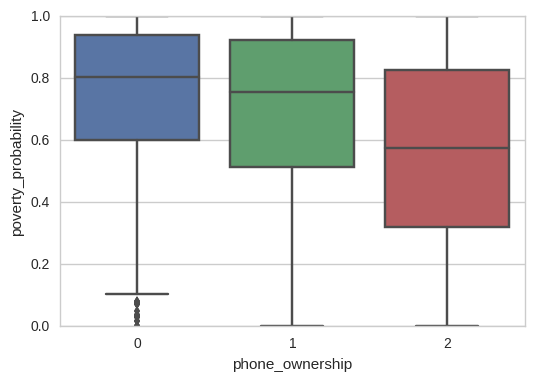

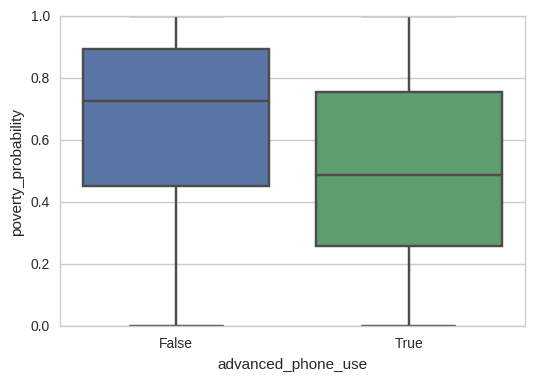

In [86]:
def plot_box(df, cols, col_y = 'poverty_probability'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.boxplot(col, col_y, data=df)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_box(df, phone_col)

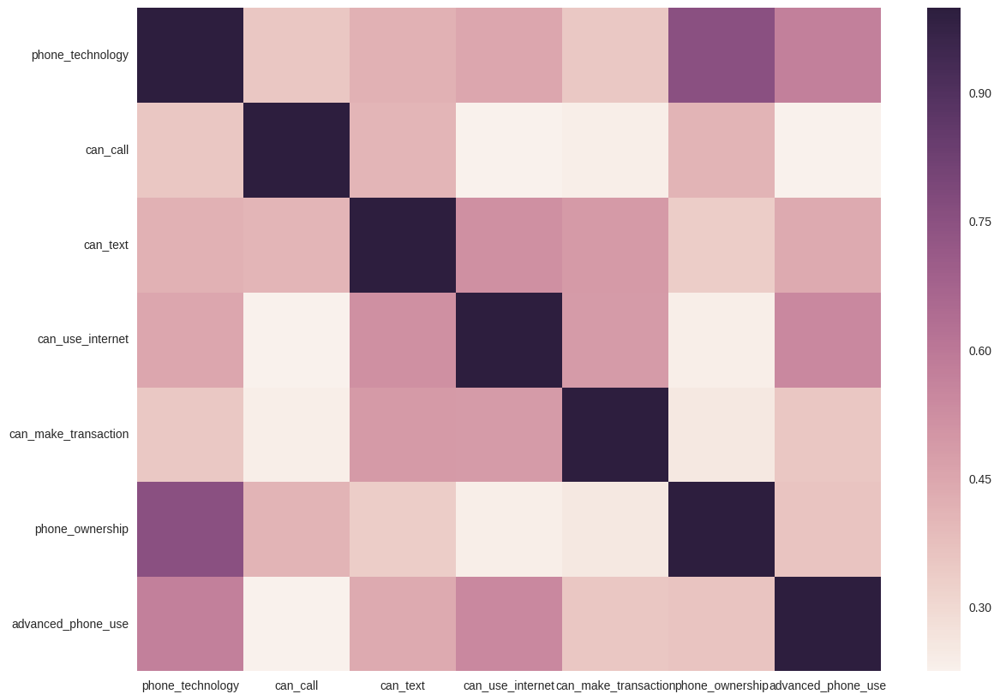

In [87]:
fig, ax = plt.subplots()
fig.set_size_inches(14, 10)

ax=sns.heatmap(df[phone_col].corr())

# Financial institutions

In [88]:
finstitutions_col = ['reg_bank_acct', 'reg_mm_acct',
       'reg_formal_nbfi_account', 'financially_included', 'active_bank_user',
       'active_mm_user', 'active_formal_nbfi_user',
       'active_informal_nbfi_user', 'nonreg_active_mm_user',
       'num_formal_institutions_last_year',
       'num_informal_institutions_last_year',
       'num_financial_activities_last_year']

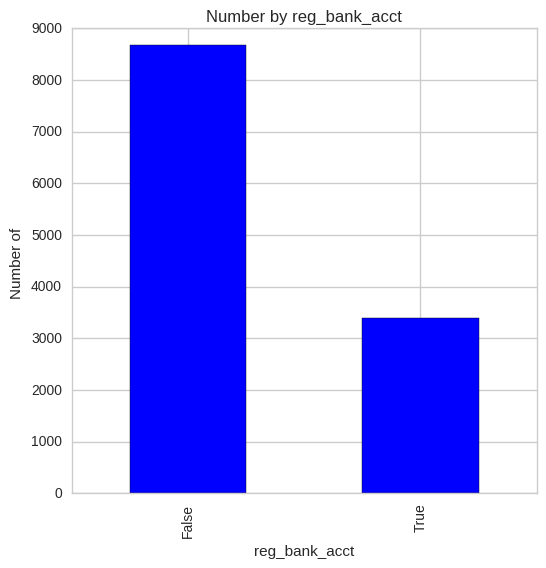

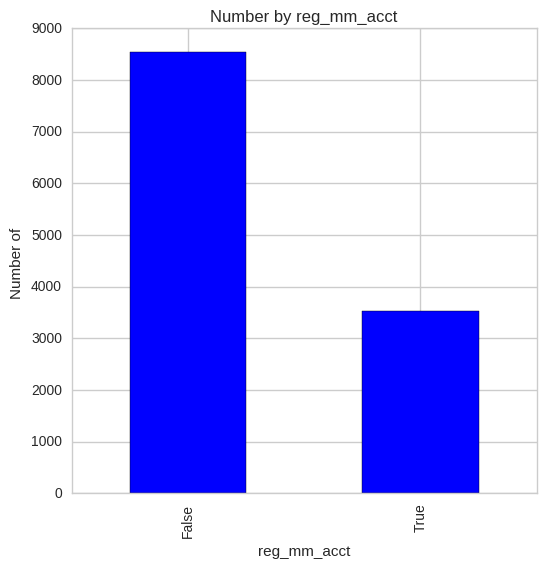

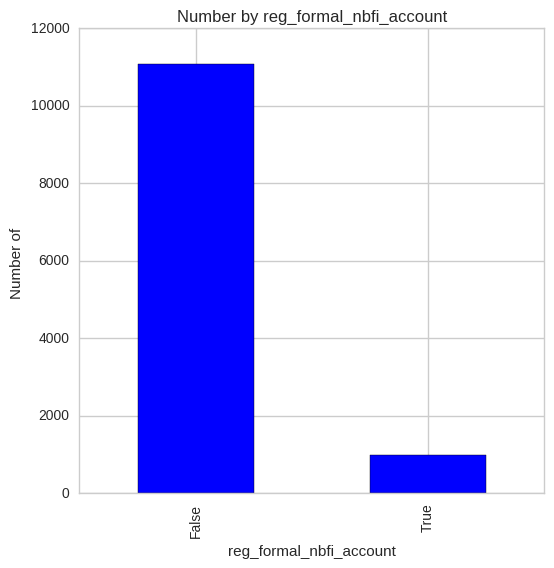

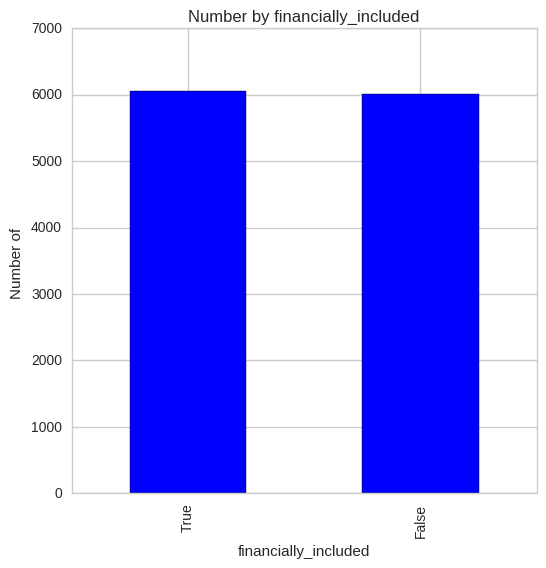

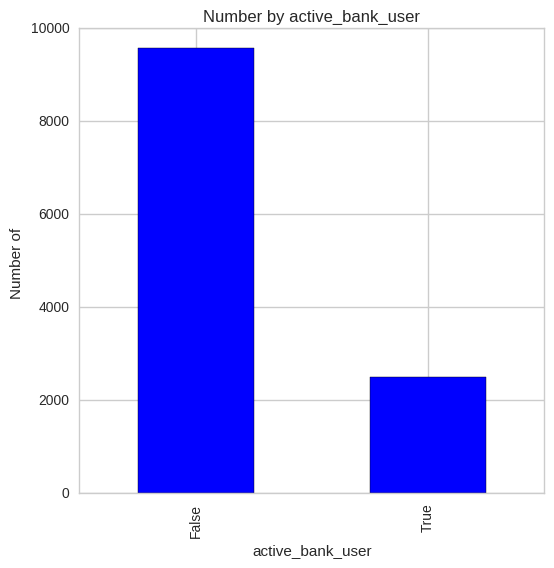

...

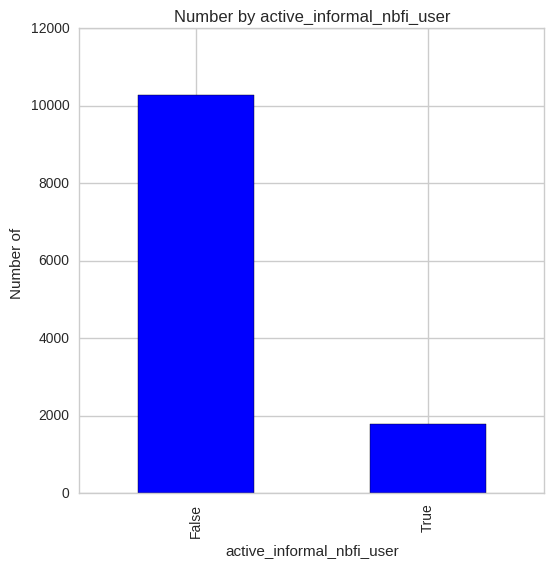

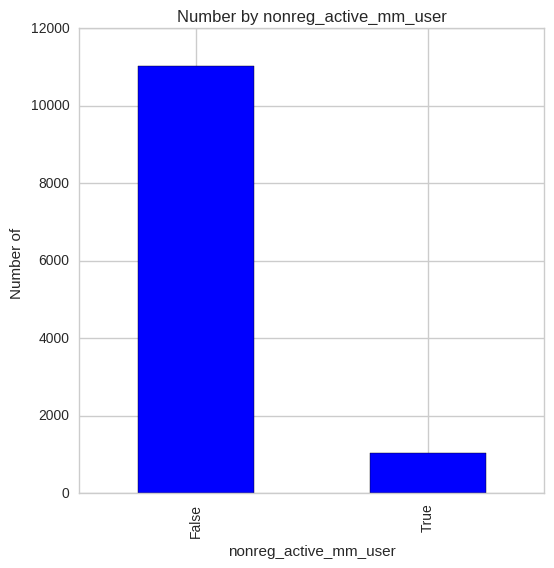

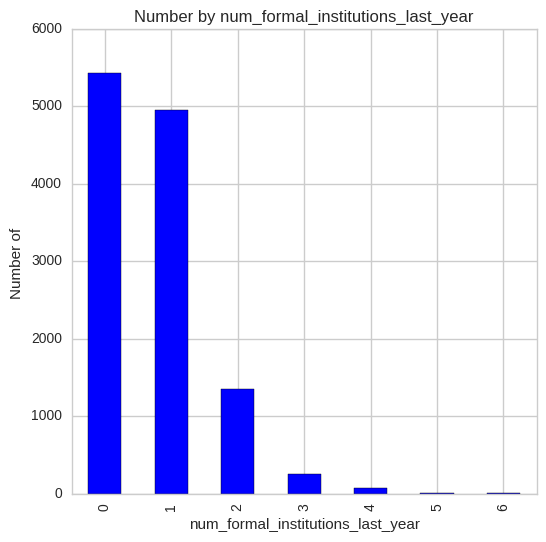

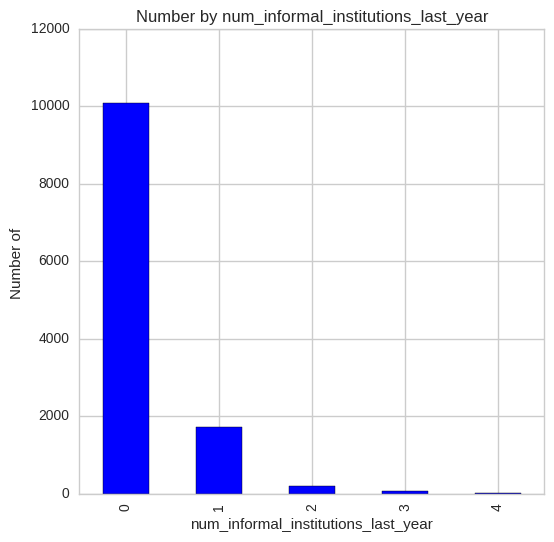

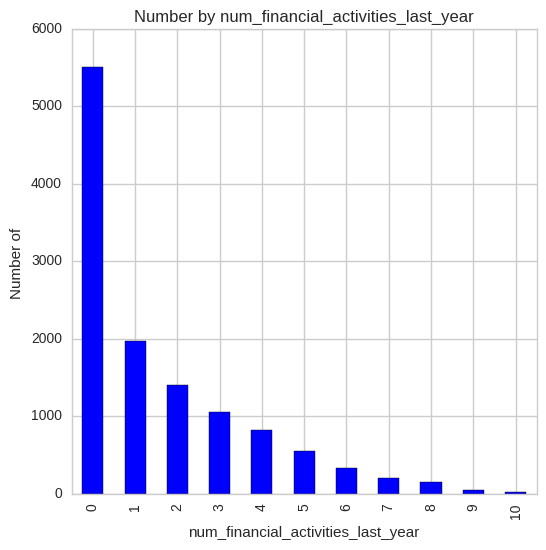

In [89]:
def plot_bars(df, cols):
    for col in cols:
        fig = plt.figure(figsize=(6,6)) # define plot area
        ax = fig.gca() # define axis    
        counts = df[col].value_counts() # find the counts for each unique category
        counts.plot.bar(ax = ax, color = 'blue') # Use the plot.bar method on the counts data frame
        ax.set_title('Number by ' + col) # Give the plot a main title
        ax.set_xlabel(col) # Set text for the x axis
        ax.set_ylabel('Number of ')# Set text for y axis
        plt.show()

plot_bars(df, finstitutions_col)

In [90]:
def count_unique(df, cols):
    for col in cols:
        print('\n' + 'For column ' + col)
        print(df[col].value_counts())

count_unique(df, finstitutions_col)


For column reg_bank_acct
False    8671
True     3397
Name: reg_bank_acct, dtype: int64

For column reg_mm_acct
False    8542
True     3526
Name: reg_mm_acct, dtype: int64

For column reg_formal_nbfi_account
False    11081
True       987
Name: reg_formal_nbfi_account, dtype: int64

For column financially_included
True     6060
False    6008
Name: financially_included, dtype: int64

For column active_bank_user
False    9573
True     2495
Name: active_bank_user, dtype: int64

For column active_mm_user
False    9062
True     3006
Name: active_mm_user, dtype: int64

For column active_formal_nbfi_user
False    11375
True       693
Name: active_formal_nbfi_user, dtype: int64

For column active_informal_nbfi_user
False    10269
True      1799
Name: active_informal_nbfi_user, dtype: int64

For column nonreg_active_mm_user
False    11039
True      1029
Name: nonreg_active_mm_user, dtype: int64

For column num_formal_institutions_last_year
0    5422
1    4944
2    1354
3     257
4      76
5     

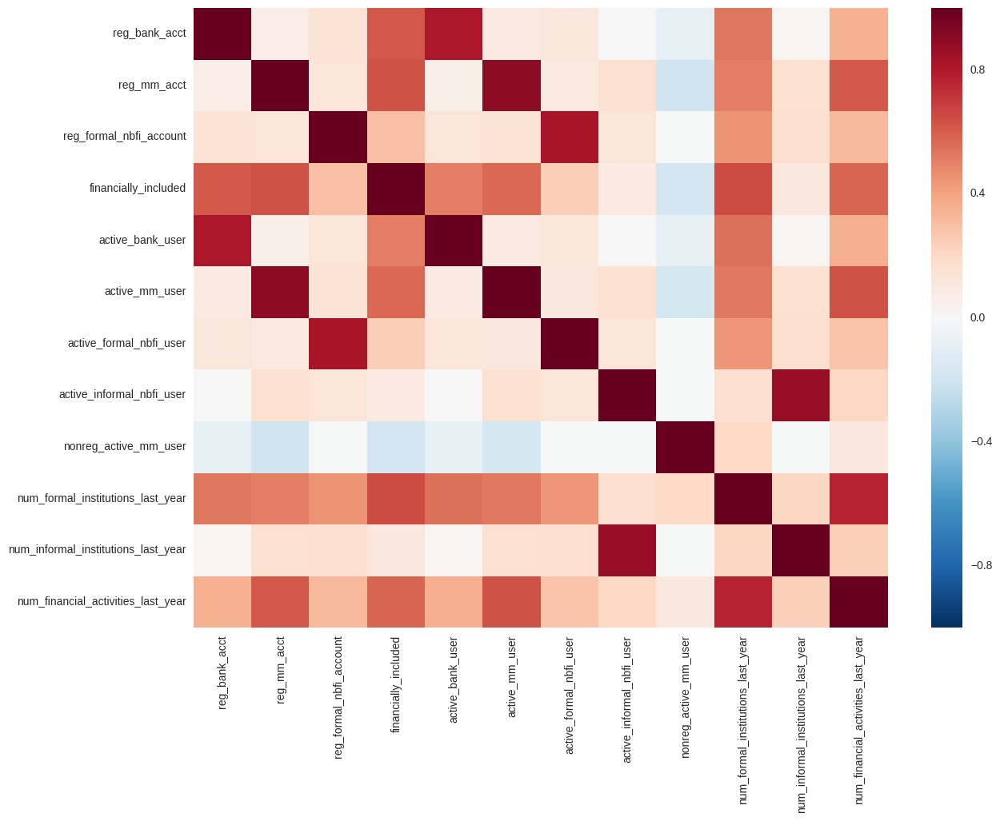

In [91]:
fig, ax = plt.subplots()
fig.set_size_inches(14, 10)

ax=sns.heatmap(df[finstitutions_col].corr())

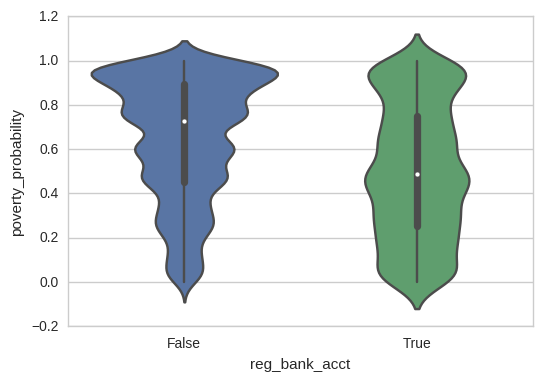

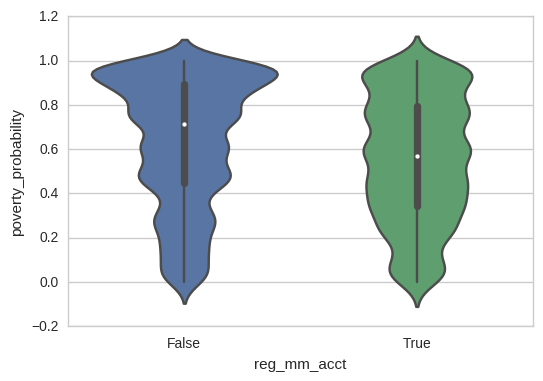

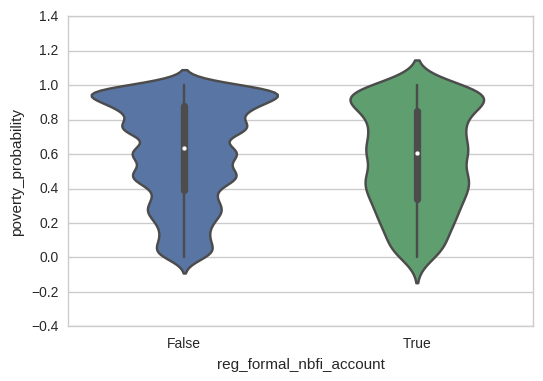

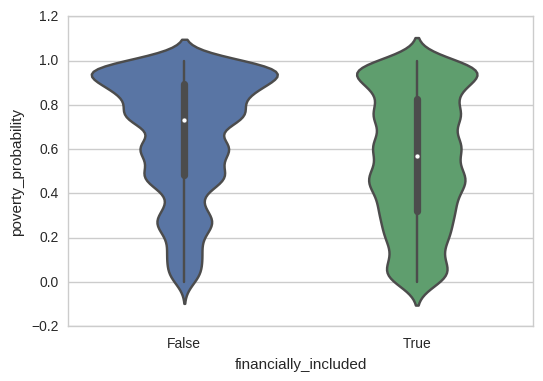

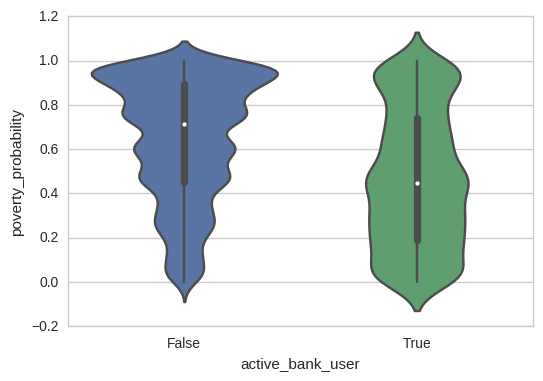

...

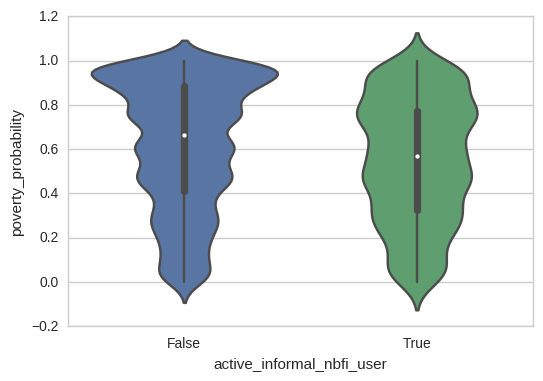

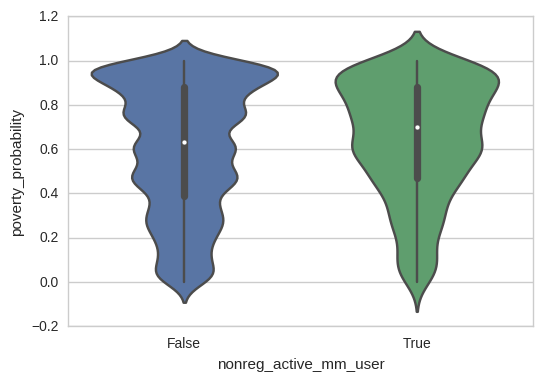

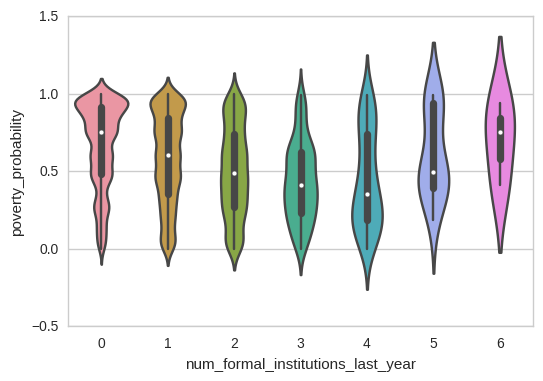

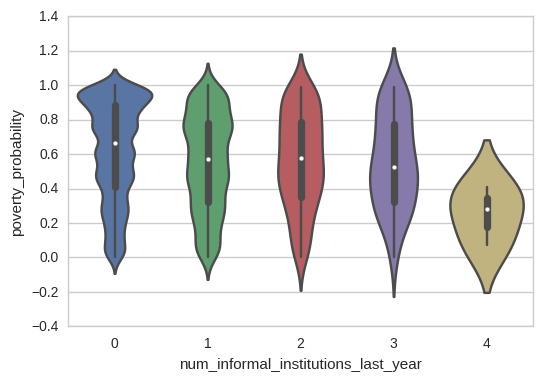

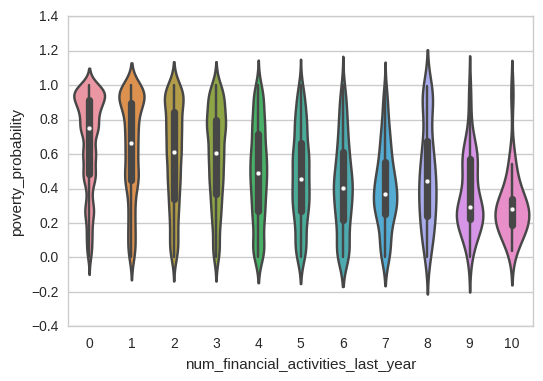

In [92]:
def plot_violin(df, cols, col_y = 'poverty_probability'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.violinplot(col, col_y, data=df)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_violin(df, finstitutions_col)

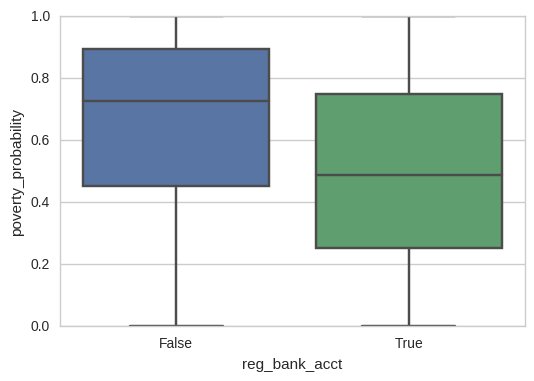

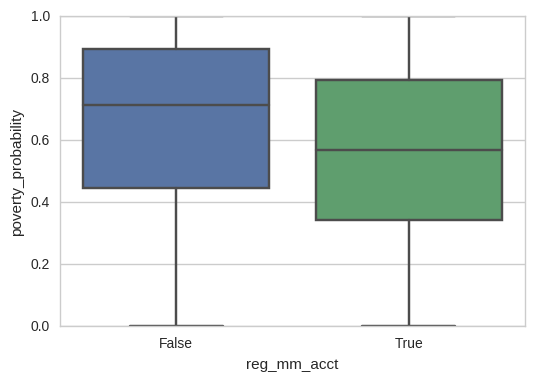

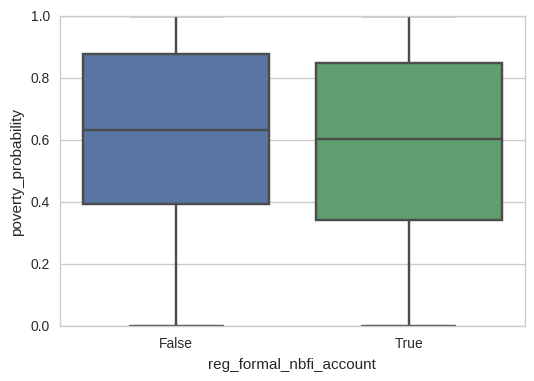

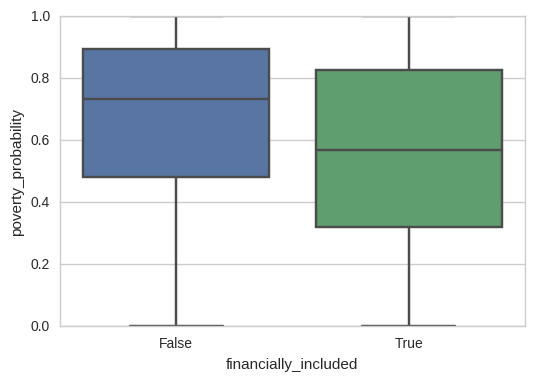

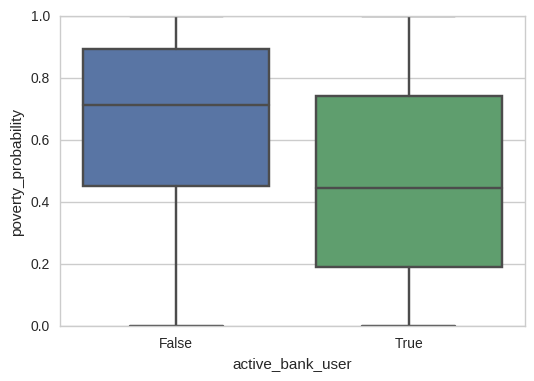

...

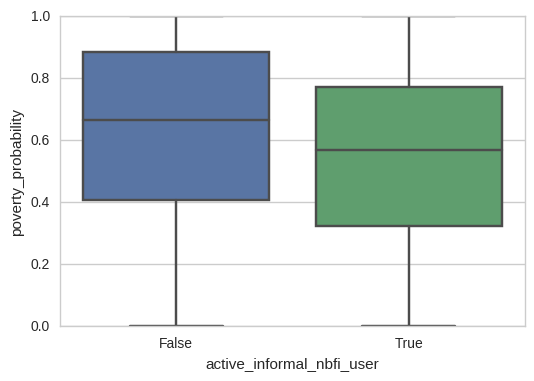

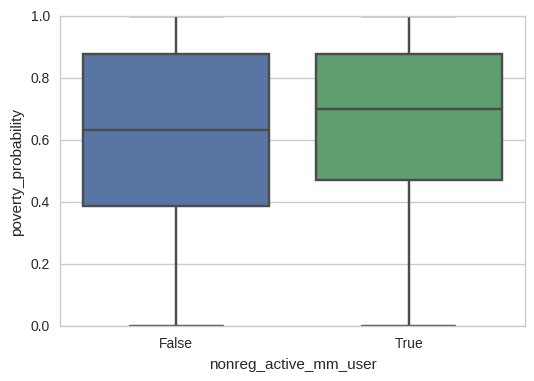

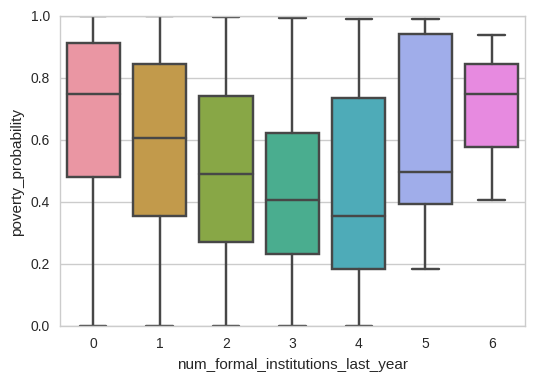

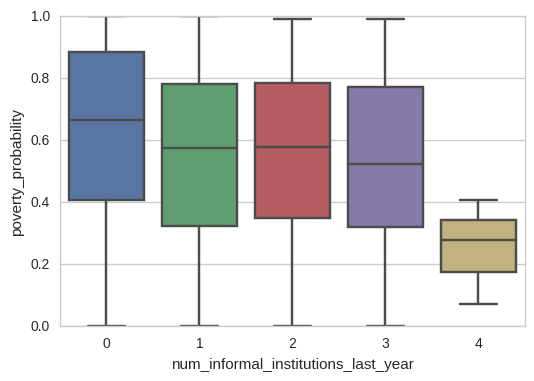

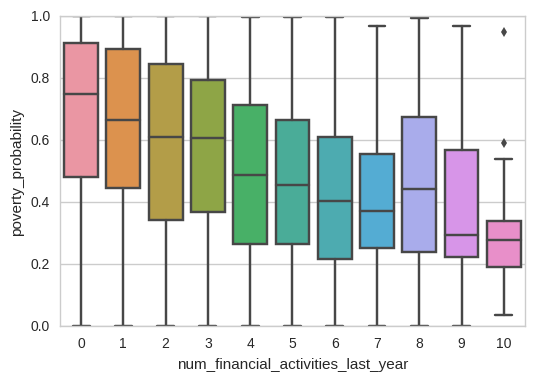

In [93]:
def plot_box(df, cols, col_y = 'poverty_probability'):
    for col in cols:
        sns.set_style("whitegrid")
        sns.boxplot(col, col_y, data=df)
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel(col_y)# Set text for y axis
        plt.show()
        
plot_box(df, finstitutions_col)